In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
negative_path = "/content/drive/MyDrive/Control_Mg_Negative.csv"
positive_path = "/content/drive/MyDrive/Control_Mg_Positive.csv"

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from scipy.stats import rankdata
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.stats import ttest_ind
from sklearn.impute import KNNImputer
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix,roc_curve, RocCurveDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
import tensorflow as tf
from tensorflow.keras import layers

sns.set(style="whitegrid")

%matplotlib inline

In [4]:
positive_data = pd.read_csv(positive_path)
negative_data = pd.read_csv(negative_path)
positive_data

,Sample,S1,S2,S3,S4,S5,S6,S7,S8,S9,...,S21,S22,S23,S24,S25,S26,S27,S28,S29,S30
0,Label,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
1,Compound2078,7.206298,7.227946,7.366802,7.262313,7.285364,6.998687,7.132948,7.160038,7.390819,...,7.315623,7.350978,7.169137,7.067084,7.070416,7.081180,7.214982,7.140902,7.017724,7.153893
2,Compound4363,7.339353,7.345237,7.556745,7.465671,7.472435,7.174356,7.553920,7.135764,7.356667,...,7.490783,6.872999,7.397464,7.300424,7.600194,7.339486,7.181688,7.452621,7.474829,7.069202
3,Compound13589,6.643306,6.687743,6.465109,6.558714,6.760262,6.825837,6.609359,6.776504,6.503055,...,6.635033,6.817662,6.590528,6.496227,6.626065,6.712181,6.720424,6.837801,6.744136,6.633435
4,Compound5278,6.844170,6.682059,6.855306,6.786066,6.608705,6.962785,6.917193,6.859684,6.852445,...,6.705961,7.050534,6.804359,6.942128,6.721300,6.783166,6.629169,6.911243,6.798165,6.971550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11587,Compound15751,5.942907,5.812424,6.014887,5.973371,5.923199,5.954896,5.984806,5.703635,5.837919,...,5.921067,5.786371,5.970959,6.012363,6.097851,5.910447,5.954089,5.794707,5.841617,5.954547
11588,Compound15759,5.897462,5.956110,5.956139,5.909347,6.049577,5.902071,5.928563,6.002281,5.963314,...,5.923813,5.701904,5.948298,5.934399,5.808896,5.880014,5.969594,5.950216,5.893222,5.816031
11589,Compound15767,5.857506,5.922598,5.858036,5.907506,5.823600,5.905061,6.008754,5.748952,5.955079,...,5.871754,5.889129,5.896064,6.004864,5.833496,5.881322,6.039688,6.070650,5.840757,5.984992
11590,Compound15771,5.974184,5.815394,5.826349,5.945384,5.977391,5.961304,5.615242,5.892542,5.894168,...,5.811251,5.738694,5.925044,6.011235,5.757122,5.852222,5.872955,5.984447,5.843946,5.875227


In [5]:
negative_data

,Sample,S1,S2,S3,S4,S5,S6,S7,S8,S9,...,S19,S20,S21,S22,S23,S24,S25,S26,S27,S28
0,Compound Annotation,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
1,Compound 468,7.475505,7.329756,6.811946,7.385248,7.626119,7.590575,7.403692,7.287125,7.355329,...,7.507965,7.435537,7.330367,7.367307,7.418969,7.351389,7.670616,7.412378,7.425305,7.367272
2,Compound 3382,6.989769,7.080236,6.889824,6.213607,6.722271,7.013836,7.060645,6.783460,7.001999,...,7.101507,6.887513,6.854224,7.062717,6.753966,6.863752,6.722227,6.822723,6.745978,6.775755
3,Compound 4793,6.819188,6.868873,6.843599,6.922629,6.833867,6.737740,6.826248,6.793886,6.845979,...,6.743371,6.835760,6.805242,6.758864,6.780618,6.735840,6.859521,6.907125,6.843397,6.905871
4,Compound 2186,6.858738,6.787733,6.856540,6.970408,6.947345,6.949742,7.394426,6.916902,6.692923,...,6.995888,6.905149,6.875869,6.914752,6.960787,6.756019,6.932341,6.792646,6.878472,6.970429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5201,Compound 5919,6.245255,6.194300,6.165928,6.390953,6.402920,6.258669,6.262649,6.370278,6.256610,...,6.269349,6.284218,6.166841,6.263467,6.387067,6.334254,6.145515,6.364408,6.246458,6.258794
5202,Compound 5930,6.265979,6.269323,6.296698,6.347539,6.403661,6.362765,6.222485,6.277444,6.303384,...,6.320016,6.411511,6.379362,6.353872,6.367754,6.400277,6.367340,6.348874,6.343532,6.375171
5203,Compound 5964,6.242246,6.124306,6.177051,6.082200,6.317291,6.257584,6.223415,6.282368,6.305714,...,6.201274,6.219690,6.144898,6.269480,6.191840,6.193191,6.295073,6.268855,6.180628,6.218116
5204,Compound 5978,6.157839,6.032436,6.130037,6.045991,6.050399,6.133175,6.040674,6.042695,6.117320,...,6.161811,6.124916,6.129828,6.095715,6.096871,6.076834,6.058739,6.199614,5.997863,5.999938


In [6]:
positive_data = positive_data.drop(0,axis = 0)
negative_data = negative_data.drop(0,axis = 0)

In [7]:
#samplewise statistics for positive data
positive_data.iloc[:, 1:].describe()

,S1,S2,S3,S4,S5,S6,S7,S8,S9,S10,...,S21,S22,S23,S24,S25,S26,S27,S28,S29,S30
count,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000,...,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000,11591.000000
mean,6.996401,6.985533,6.986095,6.977619,6.979230,6.971043,6.983943,6.964923,6.968240,6.976457,...,6.973694,6.970176,6.953833,6.974708,6.972124,6.964718,6.964874,6.975753,6.985776,6.969079
std,0.639103,0.643655,0.620728,0.661340,0.624644,0.628353,0.600852,0.629998,0.647764,0.639858,...,0.638401,0.653411,0.641114,0.620136,0.626002,0.623176,0.636877,0.616586,0.656358,0.642193
min,5.368226,5.272065,5.415173,4.971511,4.577114,5.394722,5.422743,5.293747,5.250955,5.022760,...,4.946556,5.297388,5.216584,5.405805,5.289029,5.220254,5.220683,5.224297,5.195807,5.156223
25%,6.679977,6.680197,6.676212,6.671287,6.670825,6.666925,6.670971,6.672380,6.673124,6.672765,...,6.670590,6.677650,6.669494,6.672349,6.676035,6.672995,6.670034,6.671769,6.670142,6.669544
50%,6.945885,6.940981,6.937728,6.942052,6.929538,6.930776,6.929532,6.933962,6.932658,6.936827,...,6.939910,6.935085,6.928035,6.929260,6.935673,6.927465,6.933994,6.937536,6.942539,6.931058
75%,7.331846,7.320616,7.306784,7.326813,7.300732,7.304623,7.305648,7.287942,7.304626,7.317785,...,7.311865,7.303687,7.287580,7.300398,7.298585,7.291937,7.292972,7.304418,7.325550,7.300838
max,10.381825,10.282138,10.282857,10.218109,10.196735,10.045613,10.218121,10.252226,10.128700,10.155481,...,10.393735,10.427216,10.259286,10.293810,10.060923,10.095066,10.162627,9.984048,10.335540,10.197142


In [8]:
#samplewise statistics for negative data
negative_data.iloc[:, 1:].describe()

,S1,S2,S3,S4,S5,S6,S7,S8,S9,S10,...,S19,S20,S21,S22,S23,S24,S25,S26,S27,S28
count,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000,...,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000,5205.000000
mean,7.088989,7.092271,7.078525,7.075488,7.075191,7.087294,7.089151,7.084638,7.077268,7.090120,...,7.080864,7.067163,7.075454,7.088710,7.059228,7.069885,7.075978,7.078043,7.067329,7.072145
std,0.578480,0.568823,0.584924,0.587508,0.572077,0.584182,0.578371,0.570221,0.569626,0.575367,...,0.555123,0.566367,0.597044,0.583146,0.562322,0.587103,0.555261,0.557836,0.552304,0.566090
min,5.530975,5.667683,5.443891,5.510296,5.533868,5.543956,5.565442,5.632375,5.595055,5.606844,...,5.673660,5.514384,5.400301,5.573647,5.515034,5.253933,5.640595,5.612401,5.608310,5.577736
25%,6.758468,6.761539,6.755805,6.755341,6.759622,6.764535,6.762915,6.758435,6.758332,6.758608,...,6.752571,6.752777,6.752158,6.759918,6.755757,6.756050,6.762455,6.757105,6.755924,6.754552
50%,6.991434,6.991715,6.989708,6.990831,6.976311,6.991497,6.990294,6.985199,6.988040,6.991822,...,6.980287,6.975863,6.986959,6.991685,6.970714,6.980791,6.979874,6.981884,6.979500,6.979923
75%,7.371389,7.365837,7.357220,7.352454,7.347822,7.370661,7.370892,7.363706,7.349550,7.365358,...,7.353290,7.349423,7.360592,7.372487,7.315471,7.344013,7.334904,7.339500,7.333296,7.360231
max,10.313452,10.517358,10.175624,10.251454,10.252820,10.341428,10.081599,10.442653,10.342311,10.305869,...,10.420173,10.574945,10.312091,10.035146,10.478896,10.243467,10.366128,10.345576,10.522268,10.090550


In [9]:
#so null values present is about 0
print(positive_data.isna().sum().sum())
print(negative_data.isna().sum().sum())

0
0


In [10]:
print(positive_data.columns)
print(negative_data.columns)

Index(['Sample', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'S10',
       'S11', 'S12', 'S13', 'S14', 'S15', 'S16', 'S17', 'S18', 'S19', 'S20',
       'S21', 'S22', 'S23', 'S24', 'S25', 'S26', 'S27', 'S28', 'S29', 'S30'],
      dtype='object')
Index(['Sample', 'S1', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'S10',
       'S11', 'S12', 'S13', 'S14', 'S15', 'S16', 'S17', 'S18', 'S19', 'S20',
       'S21', 'S22', 'S23', 'S24', 'S25', 'S26', 'S27', 'S28'],
      dtype='object')


In [11]:
data = pd.concat([positive_data,negative_data],axis = 0)
data.reset_index(drop=True, inplace=True)

In [12]:
#null values created
data.isna().sum().sum()

10410

# KNN Imputation

In [13]:

okk = data.isna()
okk


,Sample,S1,S2,S3,S4,S5,S6,S7,S8,S9,...,S21,S22,S23,S24,S25,S26,S27,S28,S29,S30
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16791,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,True
16792,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,True
16793,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,True
16794,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,True


In [14]:
missing_indices = []
for i, row in okk.iterrows():
    for j, value in row.items():
        if value:  # If value is True (indicating missing value)
            missing_indices.append((i, j))

print(missing_indices)
print(len(missing_indices))

[(11591, 'S29'), (11591, 'S30'), (11592, 'S29'), (11592, 'S30'), (11593, 'S29'), (11593, 'S30'), (11594, 'S29'), (11594, 'S30'), (11595, 'S29'), (11595, 'S30'), (11596, 'S29'), (11596, 'S30'), (11597, 'S29'), (11597, 'S30'), (11598, 'S29'), (11598, 'S30'), (11599, 'S29'), (11599, 'S30'), (11600, 'S29'), (11600, 'S30'), (11601, 'S29'), (11601, 'S30'), (11602, 'S29'), (11602, 'S30'), (11603, 'S29'), (11603, 'S30'), (11604, 'S29'), (11604, 'S30'), (11605, 'S29'), (11605, 'S30'), (11606, 'S29'), (11606, 'S30'), (11607, 'S29'), (11607, 'S30'), (11608, 'S29'), (11608, 'S30'), (11609, 'S29'), (11609, 'S30'), (11610, 'S29'), (11610, 'S30'), (11611, 'S29'), (11611, 'S30'), (11612, 'S29'), (11612, 'S30'), (11613, 'S29'), (11613, 'S30'), (11614, 'S29'), (11614, 'S30'), (11615, 'S29'), (11615, 'S30'), (11616, 'S29'), (11616, 'S30'), (11617, 'S29'), (11617, 'S30'), (11618, 'S29'), (11618, 'S30'), (11619, 'S29'), (11619, 'S30'), (11620, 'S29'), (11620, 'S30'), (11621, 'S29'), (11621, 'S30'), (11622,

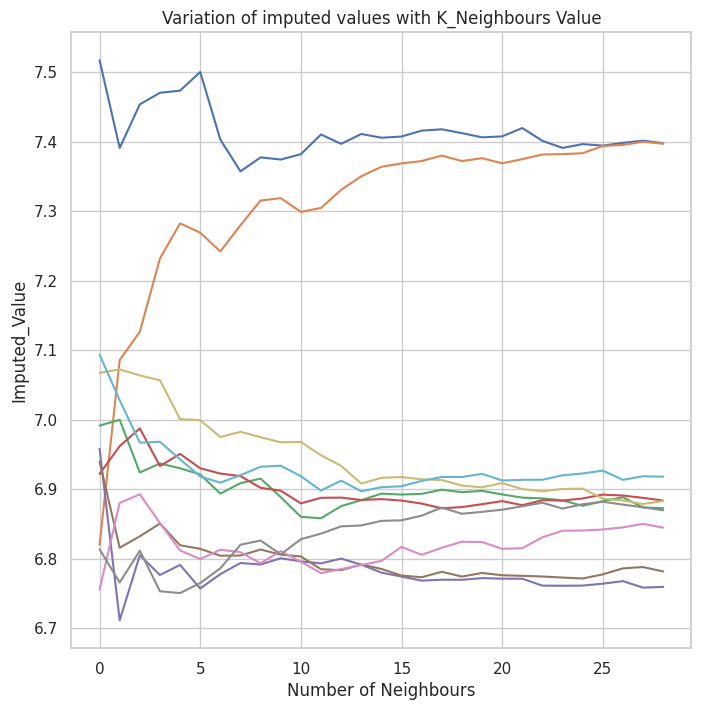

In [ ]:
#Sensitivity Analysis on KNN Imputation

imputation_data = {}
for k in range(10):
  imputation_data[f'imputation_{k}'] = []

for i in range(1,30):
  data_1 = data.copy()
  imputer = KNNImputer(n_neighbors=i, weights='uniform', metric='nan_euclidean')
  okk = imputer.fit_transform(data_1.iloc[:,9:])
  data_1.iloc[:,9:] = pd.DataFrame(okk, columns = data_1.columns[9:])
  for w in range(10):
    row_index, col_index = missing_indices[w]
    imputation_data[f'imputation_{w}'].append(data_1.loc[row_index, col_index])

fig,ax = plt.subplots(figsize = (8,8))
for j in range(10):
  ax.plot(imputation_data[f'imputation_{j}'], label = f'imputation_at_{j}')
ax.set_title("Variation of imputed values with K_Neighbours Value")
ax.set_xlabel("Number of Neighbours")
ax.set_ylabel("Imputed_Value")
plt.show()

In [13]:
data_1 = data.copy()
imputer = KNNImputer(n_neighbors=18, weights='uniform', metric='nan_euclidean')
okk = imputer.fit_transform(data_1.iloc[:,9:])
data_1.iloc[:,9:] = pd.DataFrame(okk, columns = data_1.columns[9:])
data_1

,Sample,S1,S2,S3,S4,S5,S6,S7,S8,S9,...,S21,S22,S23,S24,S25,S26,S27,S28,S29,S30
0,Compound2078,7.206298,7.227946,7.366802,7.262313,7.285364,6.998687,7.132948,7.160038,7.390819,...,7.315623,7.350978,7.169137,7.067084,7.070416,7.081180,7.214982,7.140902,7.017724,7.153893
1,Compound4363,7.339353,7.345237,7.556745,7.465671,7.472435,7.174356,7.553920,7.135764,7.356667,...,7.490783,6.872999,7.397464,7.300424,7.600194,7.339486,7.181688,7.452621,7.474829,7.069202
2,Compound13589,6.643306,6.687743,6.465109,6.558714,6.760262,6.825837,6.609359,6.776504,6.503055,...,6.635033,6.817662,6.590528,6.496227,6.626065,6.712181,6.720424,6.837801,6.744136,6.633435
3,Compound5278,6.844170,6.682059,6.855306,6.786066,6.608705,6.962785,6.917193,6.859684,6.852445,...,6.705961,7.050534,6.804359,6.942128,6.721300,6.783166,6.629169,6.911243,6.798165,6.971550
4,Compound1640,7.889506,8.302098,8.159361,8.276149,8.310145,7.928198,8.197410,7.913904,8.089097,...,8.184827,8.134914,7.995202,7.919273,8.186343,8.363670,8.159116,7.861378,8.238864,7.689810
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16791,Compound 5919,6.245255,6.194300,6.165928,6.390953,6.402920,6.258669,6.262649,6.370278,6.256610,...,6.166841,6.263467,6.387067,6.334254,6.145515,6.364408,6.246458,6.258794,6.264900,6.300099
16792,Compound 5930,6.265979,6.269323,6.296698,6.347539,6.403661,6.362765,6.222485,6.277444,6.303384,...,6.379362,6.353872,6.367754,6.400277,6.367340,6.348874,6.343532,6.375171,6.304681,6.379278
16793,Compound 5964,6.242246,6.124306,6.177051,6.082200,6.317291,6.257584,6.223415,6.282368,6.305714,...,6.144898,6.269480,6.191840,6.193191,6.295073,6.268855,6.180628,6.218116,6.222105,6.185317
16794,Compound 5978,6.157839,6.032436,6.130037,6.045991,6.050399,6.133175,6.040674,6.042695,6.117320,...,6.129828,6.095715,6.096871,6.076834,6.058739,6.199614,5.997863,5.999938,6.089855,6.111005


# Visualisation Sample-Wise Analysis

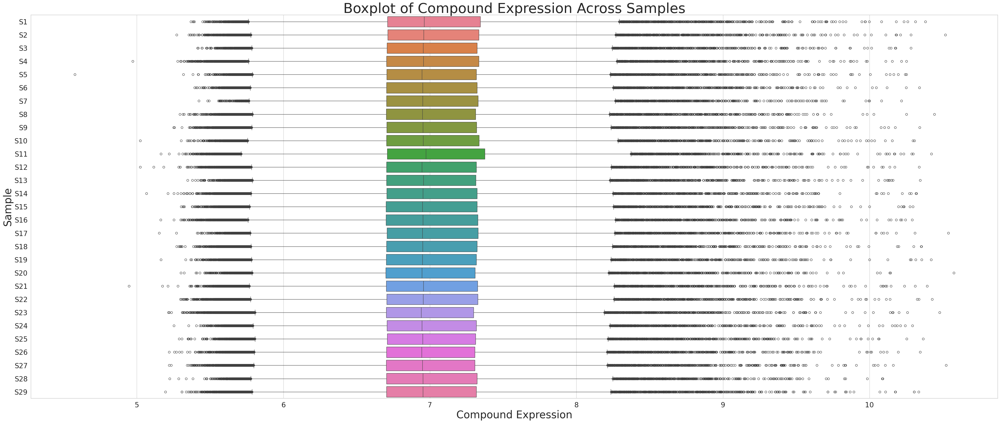

In [16]:
#samplewise boxplot of compound expression for first 30 samples
plt.figure(figsize=(50, 20))
sns.boxplot(data=data_1.iloc[:, 1:30], orient='h')  # 'h' for horizontal orientation
plt.title('Boxplot of Compound Expression Across Samples',fontsize = 40)
plt.xlabel('Compound Expression', fontsize = 30)
plt.ylabel('Sample',fontsize = 30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

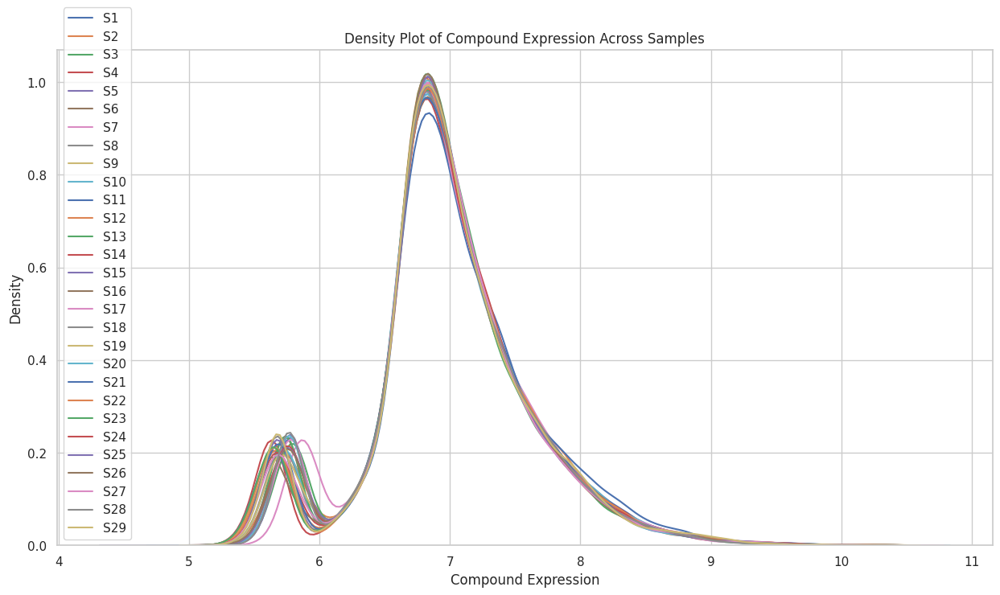

In [17]:
# Creation of a density plot for each 30 samples
plt.figure(figsize=(15, 8))

# Loopping through each sample and plot the density
for sample_id in data_1.columns[1:30]:
    sns.kdeplot(data_1[sample_id], label=sample_id)

# Setting plot labels and title
plt.title('Density Plot of Compound Expression Across Samples')
plt.xlabel('Compound Expression')
plt.ylabel('Density')
plt.legend()

plt.show()

In [18]:

def skewness_kurtosis_summary(sample_ids, data, skewness_threshold=0.5):
    summary_data = {'Sample ID': [], 'Skewness': [], 'Kurtosis': [], 'Skewness Category': []}

    for sample_id in sample_ids:
        expression_data = data[sample_id]
        skewness = expression_data.skew()
        kurtosis = expression_data.kurtosis()

        skewness_category = 'Normal' if abs(skewness) <= skewness_threshold else \
                            'Negatively Skewed' if skewness < 0 else 'Positively Skewed'

        summary_data['Sample ID'].append(sample_id)
        summary_data['Skewness'].append(skewness)
        summary_data['Kurtosis'].append(kurtosis)
        summary_data['Skewness Category'].append(skewness_category)

    summary_df = pd.DataFrame(summary_data)
    return summary_df


sample_ids_to_analyze = data_1.columns[1:]  # Replace with your desired sample IDs
skewness_kurtosis_df = pd.DataFrame(skewness_kurtosis_summary(sample_ids_to_analyze, data_1))

print(skewness_kurtosis_df.drop(columns = ['Skewness Category']))

   Sample ID  Skewness  Kurtosis
0         S1  0.402244  1.449387
1         S2  0.382964  1.527150
2         S3  0.413167  1.476225
3         S4  0.207167  1.441867
4         S5  0.393746  1.470752
5         S6  0.341220  1.419884
6         S7  0.475928  1.321334
7         S8  0.284461  1.414320
8         S9  0.229342  1.496094
9        S10  0.327080  1.447454
10       S11  0.262235  1.357354
11       S12  0.248524  1.497141
12       S13  0.323200  1.523595
13       S14  0.262131  1.564543
14       S15  0.284421  1.545153
15       S16  0.254350  1.544073
16       S17  0.411794  1.480875
17       S18  0.245504  1.473469
18       S19  0.307705  1.521903
19       S20  0.330713  1.436215
20       S21  0.289280  1.550888
21       S22  0.249820  1.525576
22       S23  0.194684  1.568135
23       S24  0.367821  1.558226
24       S25  0.351247  1.496161
25       S26  0.352084  1.561701
26       S27  0.273657  1.580219
27       S28  0.302906  1.206186
28       S29  0.282429  1.513037
29       S

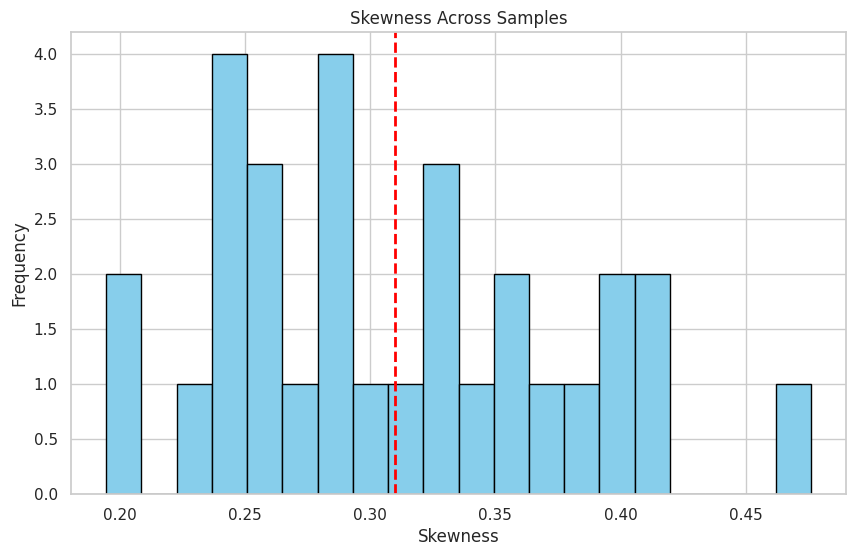

In [19]:
def plot_skewness_histogram(summary_df):
    plt.figure(figsize=(10, 6))
    plt.hist(summary_df['Skewness'], bins=20, color='skyblue', edgecolor='black')
    plt.axvline(summary_df['Skewness'].mean(), color='red', linestyle='dashed', linewidth=2, label='Mean')
    plt.title('Skewness Across Samples')
    plt.xlabel('Skewness')
    plt.ylabel('Frequency')
    plt.show()

plot_skewness_histogram(skewness_kurtosis_df)

In [20]:
def plot_pairs_plot(sample_ids, data):
    # Selection of the relevant columns based on the sample IDs
    selected_data = data[['Sample'] + sample_ids][:180]

    # Creating a pairs plot using Seaborn
    sns.set(style="ticks")
    pairs_plot = sns.pairplot(selected_data, hue='Sample', palette='husl', height=2.5,plot_kws={'legend': False})

    # Adjusting layout
    pairs_plot.fig.suptitle('Pairs Plot for Selected Samples', y=1.02,fontsize = 20)

    # Adjusting legend size and position
    pairs_plot.fig.subplots_adjust(right=0.85)

    plt.show()


sample_ids_to_plot = ['S1','S2','S3','S4','S5','S6','S7','S8','S9','S10','S11','S12','S13','S14','S15','S16','S17','S18','S19','S20','S21','S22','S23','S25','S26','S27','S28','S29','S30']
plot_pairs_plot(sample_ids_to_plot, data_1)

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7d8e6bc803a0> (for post_execute):


KeyboardInterrupt: 

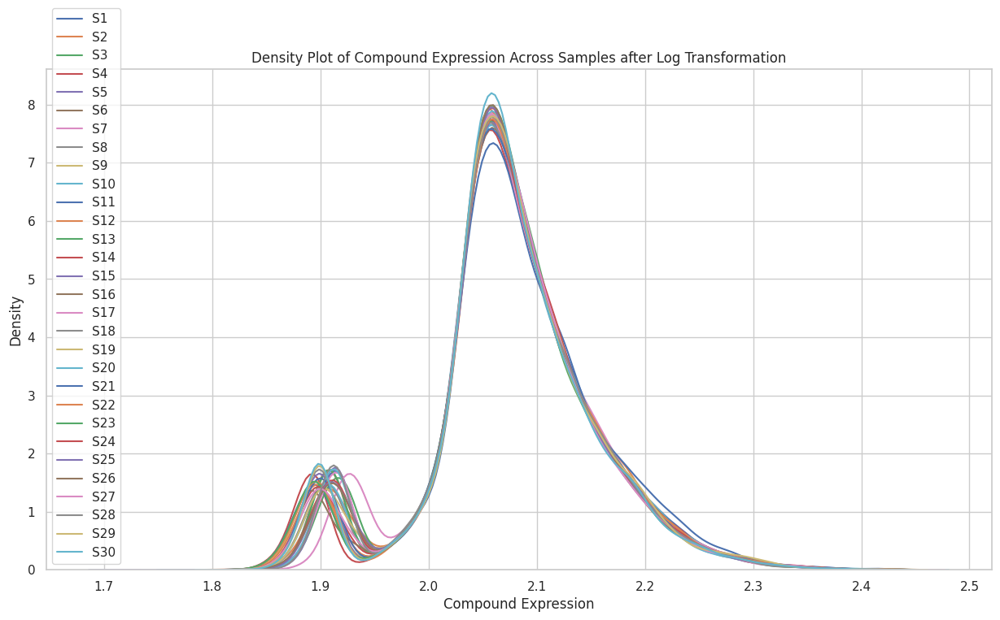

In [21]:
# Log transformation of the compound expression data
log_transformed_data = data_1.copy()
log_transformed_data.iloc[:,1:] = np.log1p(data_1.iloc[:, 1:])
sns.set_style('whitegrid')

sample_ids_to_plot = log_transformed_data.columns[1:]

# Creation of a density plot for each 30 samples
plt.figure(figsize=(15, 8))

# Loopping through each sample and plot the density
for sample_id in sample_ids_to_plot:
    sns.kdeplot(log_transformed_data[sample_id], label=sample_id)

# Setting plot labels and title
plt.title('Density Plot of Compound Expression Across Samples after Log Transformation')
plt.xlabel('Compound Expression')
plt.ylabel('Density')
plt.legend()

plt.show()

   Sample ID  Skewness  Kurtosis
0         S1  0.041183  1.031070
1         S2  0.009617  1.127039
2         S3  0.056091  1.051135
3         S4 -0.184438  1.205936
4         S5  0.034923  1.069434
5         S6 -0.021990  1.065870
6         S7  0.150381  0.885158
7         S8 -0.082916  1.120863
8         S9 -0.157528  1.226478
9        S10 -0.042960  1.097026
10       S11 -0.124249  1.086356
11       S12 -0.135625  1.210028
12       S13 -0.045991  1.132615
13       S14 -0.124694  1.232817
14       S15 -0.101837  1.193901
15       S16 -0.137805  1.238743
16       S17  0.050809  1.058302
17       S18 -0.134706  1.168150
18       S19 -0.064608  1.165590
19       S20 -0.024299  1.070419
20       S21 -0.097103  1.197993
21       S22 -0.142829  1.227664
22       S23 -0.197469  1.302949
23       S24 -0.001823  1.135293
24       S25 -0.012451  1.119266
25       S26 -0.017756  1.172311
26       S27 -0.110162  1.251851
27       S28 -0.034651  0.929706
28       S29 -0.102094  1.196441
29       S

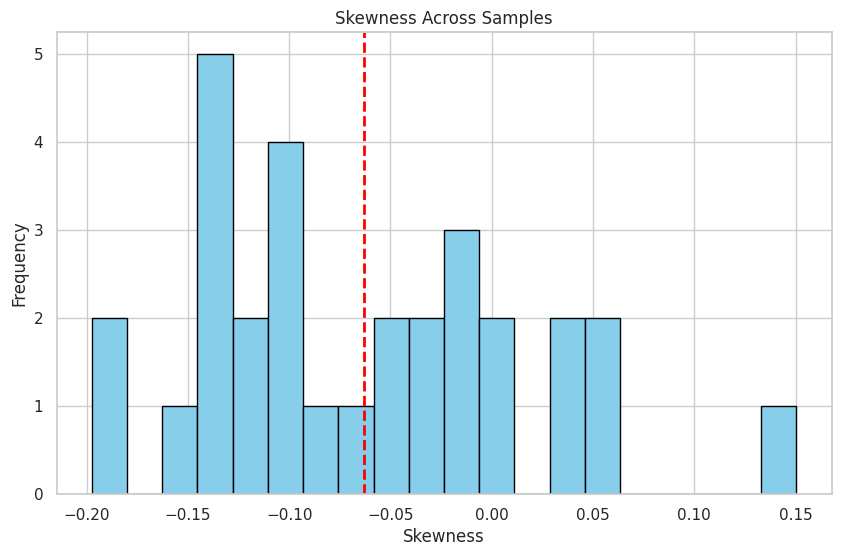

In [22]:
skewness_kurtosis_df = pd.DataFrame(skewness_kurtosis_summary(sample_ids_to_plot, log_transformed_data))
print(skewness_kurtosis_df.drop(columns = ['Skewness Category']))
plot_skewness_histogram(skewness_kurtosis_df)

In [23]:
def pearson_correlation_with_pvalues(data):
    num_samples = data.shape[1] - 1
    corr_matrix = np.zeros((num_samples, num_samples))
    pvalue_matrix = np.zeros((num_samples, num_samples))

    for i in range(num_samples):
        for j in range(num_samples):
            corr, p_value = pearsonr(data.iloc[:, i+1], data.iloc[:, j+1])
            corr_matrix[i, j] = corr
            pvalue_matrix[i, j] = p_value

    corr_df = pd.DataFrame(corr_matrix, index=data.columns[1:], columns=data.columns[1:])
    pvalue_df = pd.DataFrame(pvalue_matrix, index=data.columns[1:], columns=data.columns[1:])

    return corr_df, pvalue_df

pearson_corr, pvalues = pearson_correlation_with_pvalues(log_transformed_data)

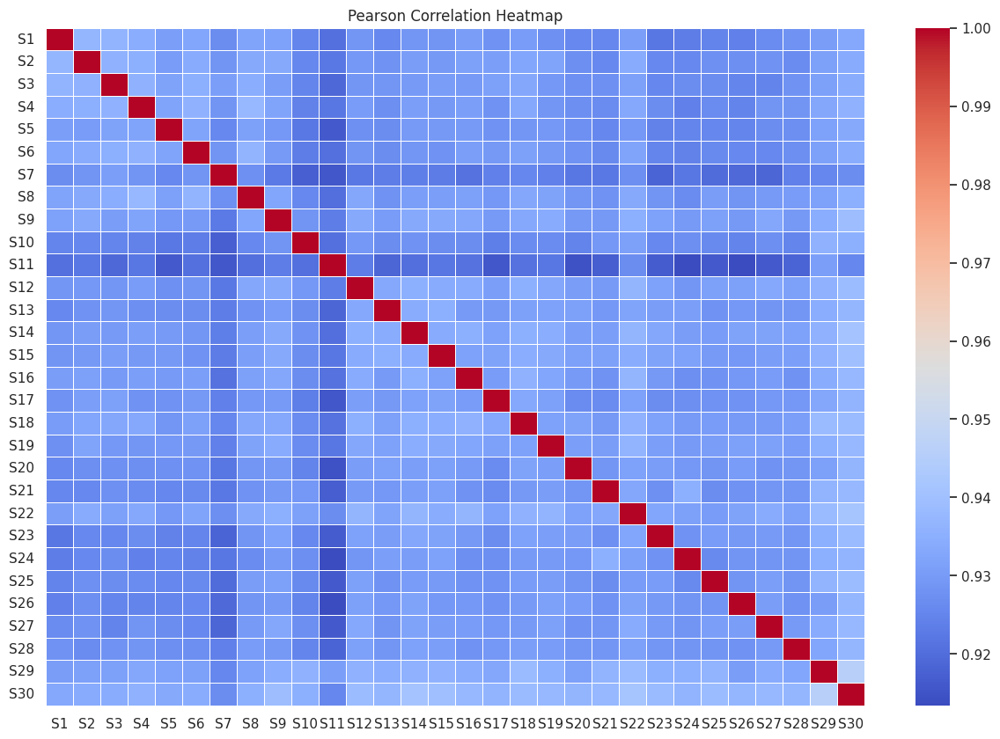

In [24]:
#pearson correlation visualisation
plt.figure(figsize=(15, 10))
sns.heatmap(pearson_corr, cmap='coolwarm', annot=False, fmt=".2f",linewidth= 0.5)
plt.title('Pearson Correlation Heatmap')
plt.show()


In [35]:
#MAD or median normalization (robust to outliers)
def median_normalization(log_transformed_data, sample_ids):
    normalized_data = log_transformed_data.copy()

    for sample_id in sample_ids:
        # Subtracting the median value of each sample from every data point to eliminate the overall shift in distribution
        normalized_data[sample_id] = (log_transformed_data[sample_id] - log_transformed_data[sample_id].median())/log_transformed_data[sample_id].median()

    return normalized_data

normalized_data = data_1.copy()
normalized_data[1:] = median_normalization(log_transformed_data[1:], log_transformed_data.columns[1:])


In [24]:
# def mad_scaling(normalized_data, sample_ids):
#     scaled_data = normalized_data.copy()

#     for sample_id in sample_ids:
#         mad_values = normalized_data[sample_id].mad()

#         scaled_data[sample_id] = normalized_data[sample_id] / mad_values

#     return scaled_data

# scaled_data = data_1.copy()
# scaled_data[1:] = mad_scaling(normalized_data.iloc[:, 1:], normalized_data.index[1:])

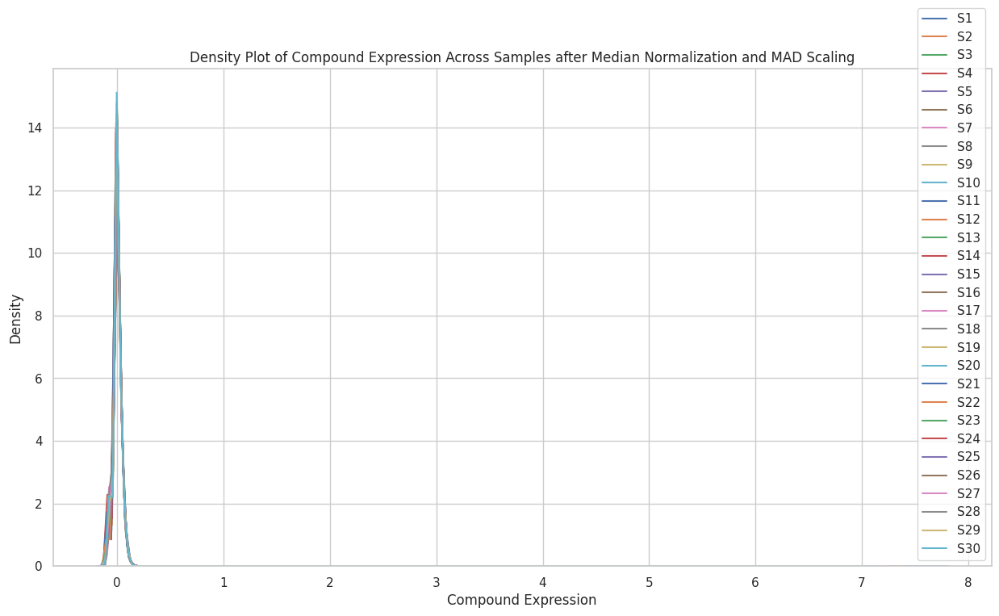

In [29]:

plt.figure(figsize=(15, 8))

# Loopping through each sample and plot the density
for sample_id in sample_ids_to_plot:
    sns.kdeplot(scaled_data[sample_id], label=sample_id)

# Setting plot labels and title
plt.title('Density Plot of Compound Expression Across Samples after Median Normalization and MAD Scaling')
plt.xlabel('Compound Expression')
plt.ylabel('Density')
plt.legend()

plt.show()

In [30]:
positive_data = pd.read_csv(positive_path)
sample_groups = positive_data.iloc[0,1:]
group_1 = sample_groups[sample_groups == 1].index.values
group_2 = sample_groups[sample_groups == 2].index.values

print("Group 1:", group_1)
print("Group 2:", group_2)

Group 1: ['S1' 'S2' 'S3' 'S4' 'S5' 'S6' 'S7' 'S8']
Group 2: ['S9' 'S10' 'S11' 'S12' 'S13' 'S14' 'S15' 'S16' 'S17' 'S18' 'S19' 'S20'
 'S21' 'S22' 'S23' 'S24' 'S25' 'S26' 'S27' 'S28' 'S29' 'S30']


In [31]:
def get_compound_stats_for_all_compounds(group_1, group_2, expression_data):
    compound_stats_list = []

    for compound_name in expression_data['Sample']:
        # Find the index of the compound
        compound_index = expression_data[expression_data['Sample'] == compound_name].index[0]

        # Extract expression values for the compound and groups
        compound_values_group_1 = expression_data.loc[compound_index, group_1].values.astype(float)
        compound_values_group_2 = expression_data.loc[compound_index, group_2].values.astype(float)

        # Perform t-test
        t_stat, p_value = ttest_ind(compound_values_group_1, compound_values_group_2)

        # Create a data frame with compound expression values
        compound_data = {
            'CompoundName': compound_name,
            'SampleID': [compound_name] * (len(group_1) + len(group_2)),
            'Expression': list(compound_values_group_1) + list(compound_values_group_2)
        }

        compound_df = pd.DataFrame(compound_data)

        # Append compound stats to the list
        compound_stats_list.append({'CompoundName': compound_name, 'TStatistic': t_stat, 'PValue': p_value})

    # Create a data frame with compound statistics
    compound_stats_df = pd.DataFrame(compound_stats_list)

    return compound_stats_df


compound_stats_df = get_compound_stats_for_all_compounds(group_1, group_2, scaled_data)

print('Compound Statistics Dataframe:')
print(compound_stats_df.head())

Compound Statistics Dataframe:
    CompoundName  TStatistic    PValue
0   Compound2078   -0.111115  0.912318
1   Compound4363    0.860304  0.396928
2  Compound13589    0.544135  0.590656
3   Compound5278   -0.981447  0.334777
4   Compound1640   -0.163646  0.871185


In [32]:
# Calculate mean expression for each group
mean_expression_group1 = scaled_data[group_1].mean(axis=1)
mean_expression_group2 = scaled_data[group_2].mean(axis=1)

# Calculate fold change
fold_change = mean_expression_group2 / mean_expression_group1

# Add fold change to the DataFrame
scaled_data['FoldChange'] = fold_change
scaled_data['PValue'] = compound_stats_df['PValue']
scaled_data['TStatistic'] = compound_stats_df['TStatistic']

# Display the DataFrame with fold change
print(scaled_data[['Sample', 'FoldChange','PValue','TStatistic']])

              Sample  FoldChange    PValue  TStatistic
0       Compound2078    1.001115  0.912318   -0.111115
1       Compound4363    0.858567  0.396928    0.860304
2      Compound13589    1.096319  0.590656    0.544135
3       Compound5278    0.624363  0.334777   -0.981447
4       Compound1640    1.009468  0.871185   -0.163646
...              ...         ...       ...         ...
16791  Compound 5919    0.985062  0.753285   -0.317413
16792  Compound 5930    0.942190  0.142125   -1.510480
16793  Compound 5964    0.998957  0.977037   -0.029043
16794  Compound 5978    0.986845  0.639359   -0.473740
16795  Compound 5980    1.033111  0.473505    0.726595

[16796 rows x 4 columns]


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-33-6e94a0396b0e>:20: RuntimeWarning: invalid value encountered in log2
  if (abs(np.log2(row['FoldChange'])) >= 1.5 and -np.log10(row['PValue']) >= 5):


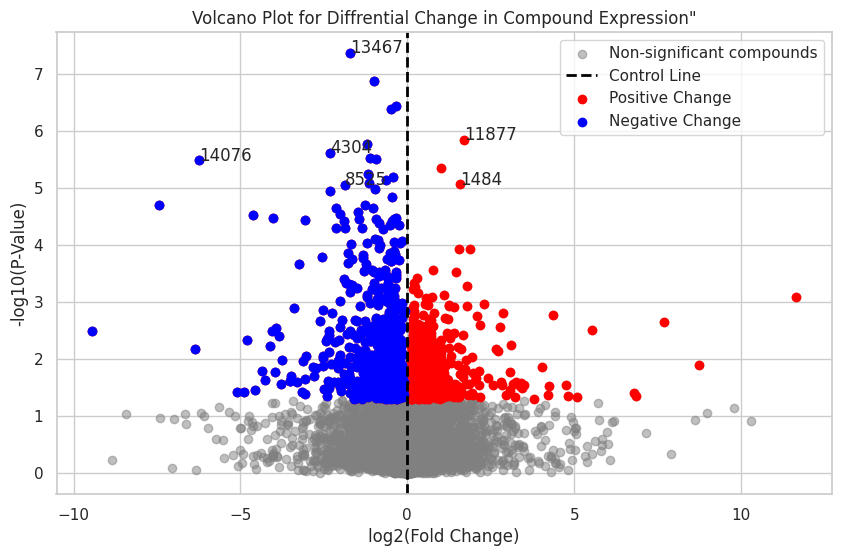

In [33]:
# Create a volcano plot
plt.figure(figsize=(10, 6))

# Scatter plot with log2(FoldChange)
plt.scatter(np.log2(scaled_data['FoldChange']), -np.log10(scaled_data['PValue']), color='grey', alpha=0.5)

# Highlight significant genes (optional)
significance_threshold = -np.log10(0.05)
significant_genes = scaled_data[scaled_data['PValue'] < 0.05]

plt.axvline(x=0, color='black', linestyle='--', linewidth=2, label='Control Line')
plt.scatter(np.log2(significant_genes['FoldChange']), -np.log10(significant_genes['PValue']), color='red', label='Positive Fold Change')

# Scatter plot for negative fold change
plt.scatter(np.log2(significant_genes[significant_genes['FoldChange'] < 1]['FoldChange']),
            -np.log10(significant_genes[significant_genes['FoldChange'] < 1]['PValue']),
            color='blue', label='Negative Fold Change')

for index, row in scaled_data.iterrows():
  if (abs(np.log2(row['FoldChange'])) >= 1.5 and -np.log10(row['PValue']) >= 5):
    plt.annotate(index, (np.log2(row['FoldChange']), -np.log10(row['PValue'])))

# Set plot labels and title
plt.title('Volcano Plot for Diffrential Change in Compound Expression"')
plt.xlabel('log2(Fold Change)')
plt.ylabel('-log10(P-Value)')

# Add a legend with customized labels
plt.legend(labels={'Non-significant compounds' : 'Non significant compounds', 'Control Line': 'Control Line','Positive Change': 'Positive','Negative Change': 'Negative'})

# Show the plot
plt.show()


# Visualization (Multivariate Analysis)

In [14]:
feature_data = data_1.T
positive_data = pd.read_csv(positive_path)
okk = positive_data.T
feature_data[16796] = okk[0]

In [15]:
feature_data.columns = feature_data.iloc[0]
feature_data = feature_data.drop('Sample')
feature_data

Sample,Compound2078,Compound4363,Compound13589,Compound5278,Compound1640,Compound1644,Compound14195,Compound1725,Compound10230,Compound11327,...,Compound 5864,Compound 5869,Compound 5891,Compound 5900,Compound 5919,Compound 5930,Compound 5964,Compound 5978,Compound 5980,Label
S1,7.206298,7.339353,6.643306,6.84417,7.889506,7.397869,6.556941,7.556308,6.956883,6.661771,...,6.45122,6.537409,6.293003,6.332792,6.245255,6.265979,6.242246,6.157839,5.683136,1.0
S2,7.227946,7.345237,6.687743,6.682059,8.302098,7.073804,6.475848,7.584376,6.931647,6.731832,...,6.342426,6.482791,6.407777,6.351458,6.1943,6.269323,6.124306,6.032436,5.884875,1.0
S3,7.366802,7.556745,6.465109,6.855306,8.159361,7.180634,6.600726,7.782393,6.828272,6.798851,...,6.365171,6.536428,6.473196,6.313976,6.165928,6.296698,6.177051,6.130037,5.765027,1.0
S4,7.262313,7.465671,6.558714,6.786066,8.276149,7.376412,6.666045,7.558829,6.820814,6.686754,...,6.350146,6.486427,6.437306,6.408881,6.390953,6.347539,6.0822,6.045991,5.616814,1.0
S5,7.285364,7.472435,6.760262,6.608705,8.310145,7.262928,6.538886,7.72045,6.89713,6.66785,...,6.412558,6.364361,6.449154,6.274385,6.40292,6.403661,6.317291,6.050399,5.886334,1.0
S6,6.998687,7.174356,6.825837,6.962785,7.928198,7.216227,6.623064,7.517319,6.672121,6.78445,...,6.411341,6.51427,6.419122,6.342484,6.258669,6.362765,6.257584,6.133175,5.653571,1.0
S7,7.132948,7.55392,6.609359,6.917193,8.19741,7.17679,6.693175,7.527826,6.900015,6.732847,...,6.383081,6.349379,6.435712,6.401976,6.262649,6.222485,6.223415,6.040674,5.901391,1.0
S8,7.160038,7.135764,6.776504,6.859684,7.913904,7.25132,6.717806,7.855232,6.777407,6.714273,...,6.418244,6.38073,6.447258,6.362343,6.370278,6.277444,6.282368,6.042695,5.905859,1.0
S9,7.390819,7.356667,6.503055,6.852445,8.089097,7.137726,6.66098,7.581239,6.793679,6.599669,...,6.393926,6.495857,6.373951,6.348692,6.25661,6.303384,6.305714,6.11732,5.715543,2.0
S10,7.154482,7.285962,6.491681,6.974768,8.222929,7.617274,6.645188,7.975537,6.75895,6.746146,...,6.409146,6.535594,6.457081,6.468728,6.339981,6.297272,6.211835,6.018717,5.695217,2.0


In [16]:
feature_data = feature_data.astype(float)
feature_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30 entries, S1 to S30
Columns: 16797 entries, Compound2078 to Label
dtypes: float64(16797)
memory usage: 3.8+ MB


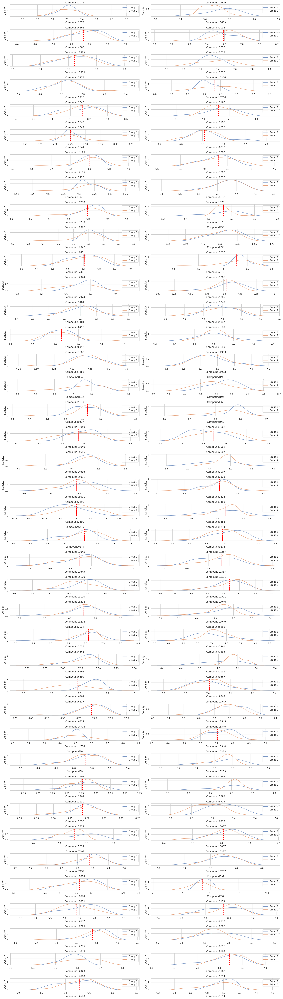

In [ ]:
#visualisation of each feature
fig,ax = plt.subplots(figsize = (20,70),nrows = 40 ,ncols = 2)
for i,values in enumerate(feature_data.columns[:80]):
  if i <40:
    sns.kdeplot(data=feature_data[feature_data['Label'] == 1], x=values, ax=ax[i][0],alpha = 0.7,common_norm = True, label = 'Group 1')
    sns.kdeplot(data = feature_data[feature_data['Label'] == 2], x=values, ax=ax[i][0],alpha = 0.7,common_norm = True, label ='Group 2')
    ax[i][0].axvline(feature_data[values].mean(), color='red', linestyle='dashed', linewidth=2)
    ax[i][0].set_title(values)
    ax[i][0].legend()
  else:
    sns.kdeplot(data=feature_data[feature_data['Label'] == 1], x=values, ax=ax[i-40][1],alpha = 0.7,common_norm = True,label = 'Group 1')
    sns.kdeplot(data=feature_data[feature_data['Label'] == 2], x=values, ax=ax[i-40][1],alpha = 0.7,common_norm = True,label ='Group 2')
    ax[i-40][1].axvline(feature_data[values].mean(), color='red', linestyle='dashed', linewidth=2)
    ax[i-40][1].set_title(values)
    ax[i-40][1].legend()

plt.tight_layout()
plt.show()

In [ ]:
feature_data.describe()

Sample,Compound2078,Compound4363,Compound13589,Compound5278,Compound1640,Compound1644,Compound14195,Compound1725,Compound10230,Compound11327,...,Compound 5864,Compound 5869,Compound 5891,Compound 5900,Compound 5919,Compound 5930,Compound 5964,Compound 5978,Compound 5980,Label
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,...,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000
mean,7.210942,7.333420,6.644001,6.850958,8.128256,7.252406,6.597609,7.616356,6.794088,6.695687,...,6.379514,6.457194,6.408382,6.364040,6.291410,6.330290,6.211924,6.085421,5.759442,1.733333
std,0.172133,0.171613,0.117403,0.129762,0.171873,0.211560,0.139144,0.222965,0.158339,0.089848,...,0.061877,0.072235,0.072468,0.061814,0.069804,0.057019,0.057968,0.053680,0.116243,0.449776
min,6.820529,6.872999,6.415967,6.608705,7.689810,6.741294,6.086074,6.893817,6.324381,6.380943,...,6.236236,6.280885,6.224694,6.194422,6.145515,6.198079,6.082200,5.997863,5.471979,1.000000
25%,7.099225,7.204729,6.566559,6.778863,8.006234,7.160498,6.559250,7.537250,6.772151,6.668800,...,6.352150,6.404723,6.374437,6.337804,6.258700,6.290043,6.177945,6.041180,5.695453,1.250000
50%,7.187718,7.342361,6.653537,6.853876,8.159239,7.246884,6.621247,7.666124,6.832251,6.709376,...,6.381599,6.467301,6.420755,6.365366,6.284284,6.345536,6.203154,6.082399,5.758616,2.000000
75%,7.322932,7.470744,6.733334,6.915705,8.234881,7.314742,6.675859,7.757838,6.894585,6.741485,...,6.410792,6.511761,6.454289,6.399688,6.358302,6.373317,6.253749,6.128600,5.866606,2.000000
max,7.785661,7.600194,6.837801,7.254883,8.403842,7.903491,6.801275,7.975537,6.996831,6.837627,...,6.517161,6.603532,6.561626,6.468728,6.402920,6.412329,6.317291,6.199614,5.938979,2.000000


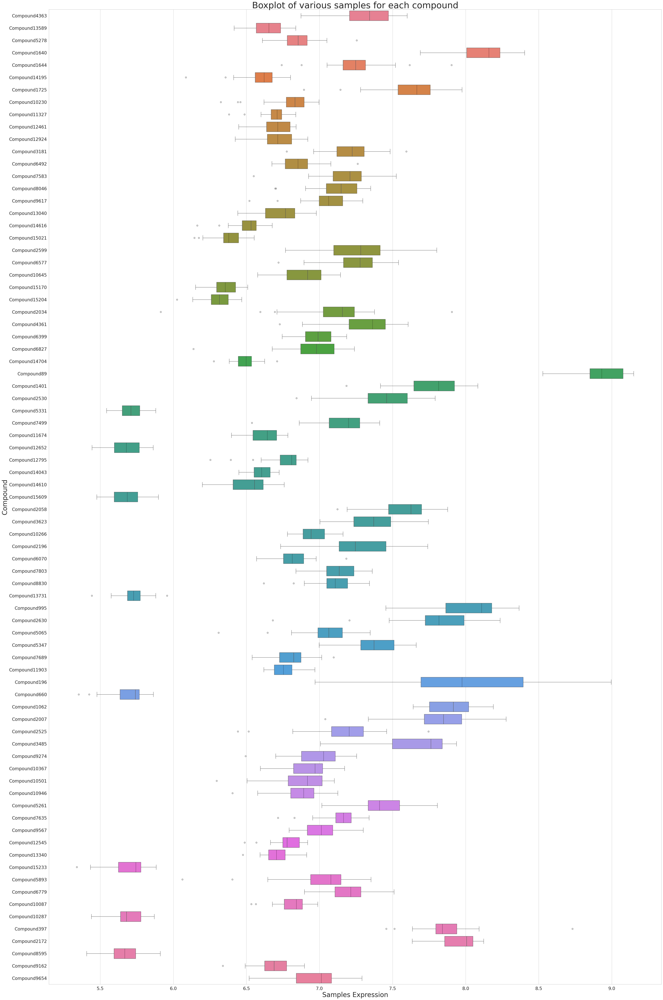

In [ ]:
#featurewise boxplot of compound expression for first 80 compounds
plt.figure(figsize=(50, 80))
sns.boxplot(data=feature_data.iloc[:, 1:80], orient='h')  # 'h' for horizontal orientation
plt.title('Boxplot of various samples for each compound',fontsize = 40)
plt.xlabel('Samples Expression', fontsize = 30)
plt.ylabel('Compound',fontsize = 30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

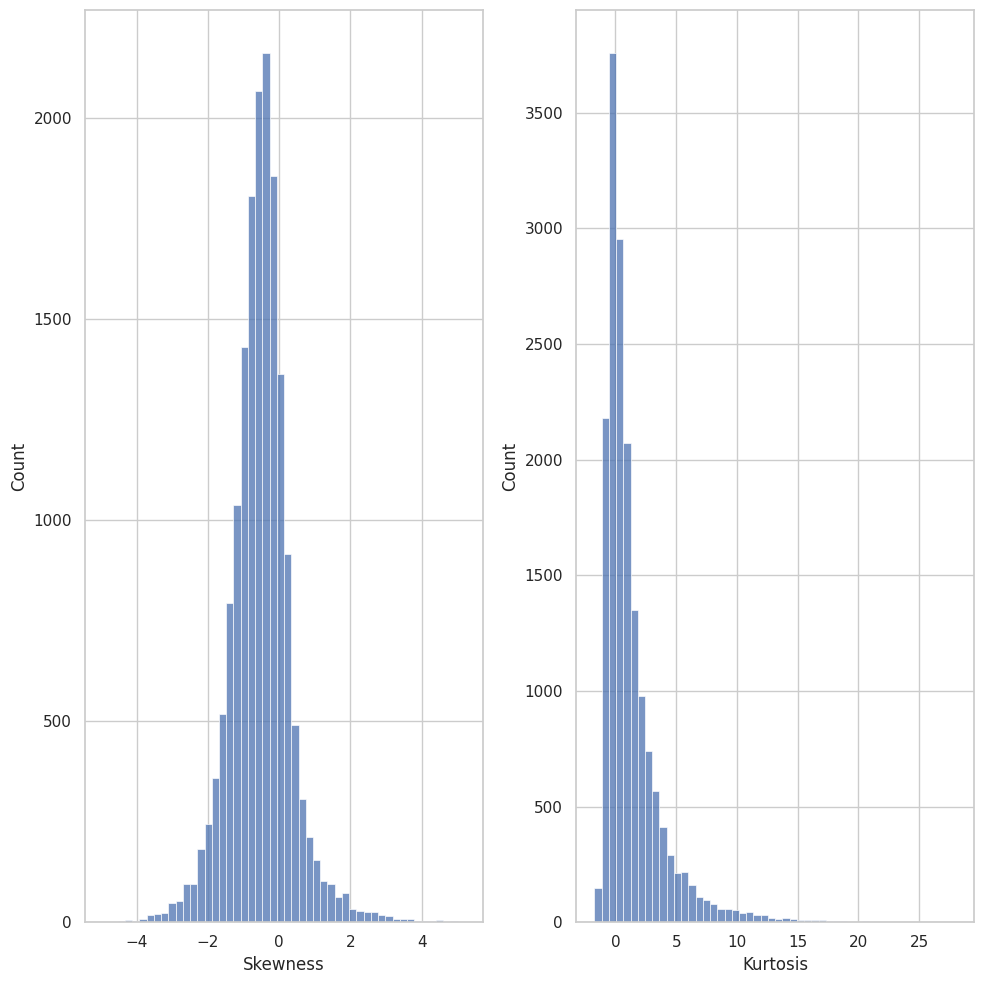

In [ ]:
#skewness for each feature
okk = {
    "Skewness" : pd.Series(feature_data[feature_data.columns].skew()),
    "Kurtosis" : pd.Series(feature_data[feature_data.columns].kurtosis())
}
stats = pd.DataFrame(okk)
fig,ax = plt.subplots(figsize = (10,10),ncols = 2)
sns.histplot(stats['Skewness'],bins = 50, ax =ax[0])
sns.histplot(stats['Kurtosis'],bins = 50, ax =ax[1])
plt.tight_layout()
plt.show()


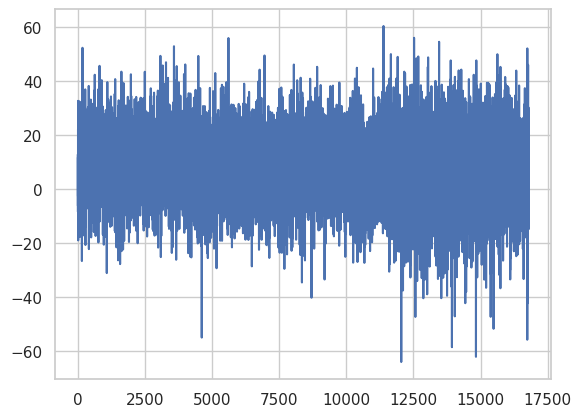

In [17]:
from scipy.stats import boxcox
lambdas = []

for i in feature_data.columns[:-1]:
  feature_data[i],okk = boxcox(feature_data[i])
  lambdas.append(okk)

plt.plot(lambdas)
plt.show()

In [ ]:
# from sklearn.preprocessing import MinMaxScaler

# #scaling of data on same scale for further analysis(Z-score normalization)
# std_scale = MinMaxScaler()
# feature_data[feature_data.columns[:-1]]= std_scale.fit_transform(feature_data[feature_data.columns[:-1]])
# feature_data


In [18]:
#scaling of data on same scale for further analysis(Z-score normalization)
std_scale = StandardScaler()
feature_data[feature_data.columns[:-1]]= std_scale.fit_transform(feature_data[feature_data.columns[:-1]])
feature_data

Sample,Compound2078,Compound4363,Compound13589,Compound5278,Compound1640,Compound1644,Compound14195,Compound1725,Compound10230,Compound11327,...,Compound 5864,Compound 5869,Compound 5891,Compound 5900,Compound 5919,Compound 5930,Compound 5964,Compound 5978,Compound 5980,Label
S1,0.054180,-0.100584,-0.072038,0.031804,-1.359991,0.734368,-0.553593,-0.505212,1.459589,-0.629294,...,1.198207,1.178092,-1.528730,-0.594721,-0.708391,-1.151307,0.539402,1.330264,-0.725607,1.0
S2,0.185447,-0.063551,0.326378,-1.445199,1.080558,-0.857874,-1.100562,-0.370098,1.116944,0.318566,...,-0.633603,0.297903,-0.113692,-0.299673,-1.373940,-1.104287,-1.551825,-1.016591,1.141513,1.0
S3,0.964752,1.528995,-1.480277,0.121679,0.081117,-0.304521,-0.192816,0.813981,-0.001899,1.570607,...,-0.268681,1.161314,0.934590,-0.875828,-1.721014,-0.693081,-0.605668,0.873848,-0.031110,1.0
S4,0.388220,0.776949,-0.776755,-0.460003,0.884676,0.636588,0.448993,-0.493366,-0.067507,-0.326771,...,-0.510781,0.353246,0.334744,0.718840,1.529269,0.209630,-2.320200,-0.724508,-1.231284,1.0
S5,0.520463,0.829147,1.021200,-2.231341,1.142657,0.102119,-0.688137,0.395857,0.695941,-0.558950,...,0.521862,-1.279529,0.525862,-1.417511,1.737433,1.458325,1.825129,-0.632145,1.157030,1.0
S6,-1.358487,-1.006378,1.700056,0.922685,-1.184236,-0.126612,0.011772,-0.681381,-1.061151,1.267452,...,0.501035,0.792182,0.054024,-0.443589,-0.523742,0.519884,0.804961,0.926627,-0.957016,1.0
S7,-0.411969,1.503999,-0.363085,0.597063,0.329463,-0.323922,0.757405,-0.635181,0.729151,0.334731,...,0.025234,-1.450762,0.309545,0.586933,-0.468183,-1.705423,0.211390,-0.837863,1.319016,1.0
S8,-0.235863,-1.184963,1.184743,0.156637,-1.250253,0.045758,1.061314,1.370491,-0.415758,0.050721,...,0.619530,-1.085680,0.494829,-0.119813,1.178874,-0.987260,1.231034,-0.794680,1.367735,1.0
S9,1.089264,0.009396,-1.204284,0.098720,-0.345795,-0.523221,0.394303,-0.385557,-0.291661,-1.242068,...,0.206059,0.498880,-0.581774,-0.344437,-0.552353,-0.585168,1.628998,0.653137,-0.460422,2.0
S10,-0.271599,-0.420876,-1.288302,1.005000,0.503149,1.678651,0.229339,2.467083,-0.547809,0.553931,...,0.463530,1.147100,0.657473,1.982945,0.685938,-0.683938,0.008594,-1.323067,-0.628184,2.0


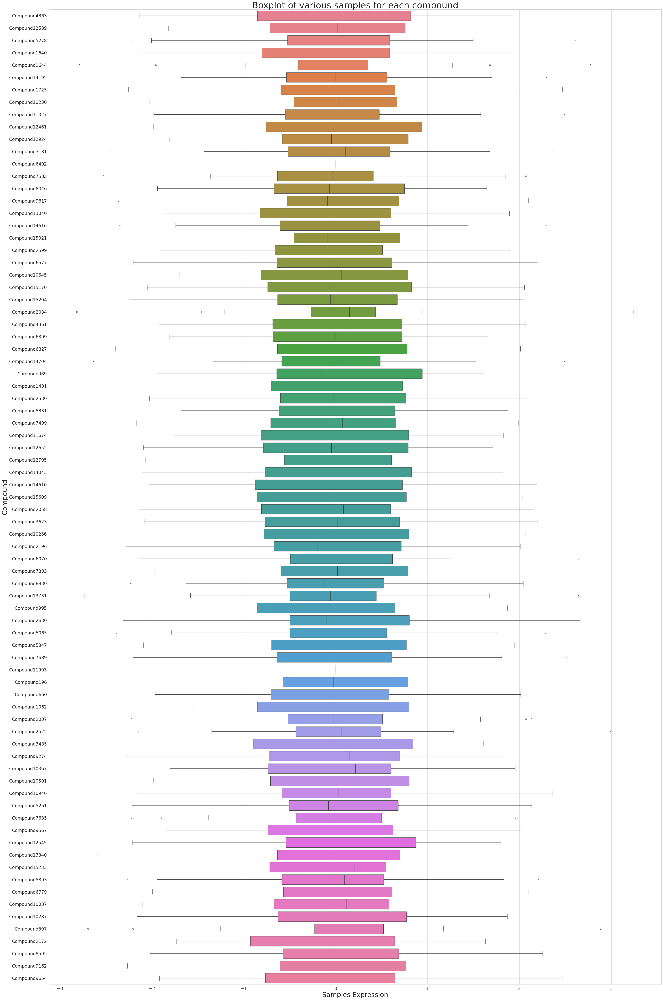

In [19]:
#featurewise boxplot of compound expression for first 80 compounds
plt.figure(figsize=(50, 80))
sns.boxplot(data=feature_data.iloc[:, 1:80], orient='h')  # 'h' for horizontal orientation
plt.title('Boxplot of various samples for each compound',fontsize = 40)
plt.xlabel('Samples Expression', fontsize = 30)
plt.ylabel('Compound',fontsize = 30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

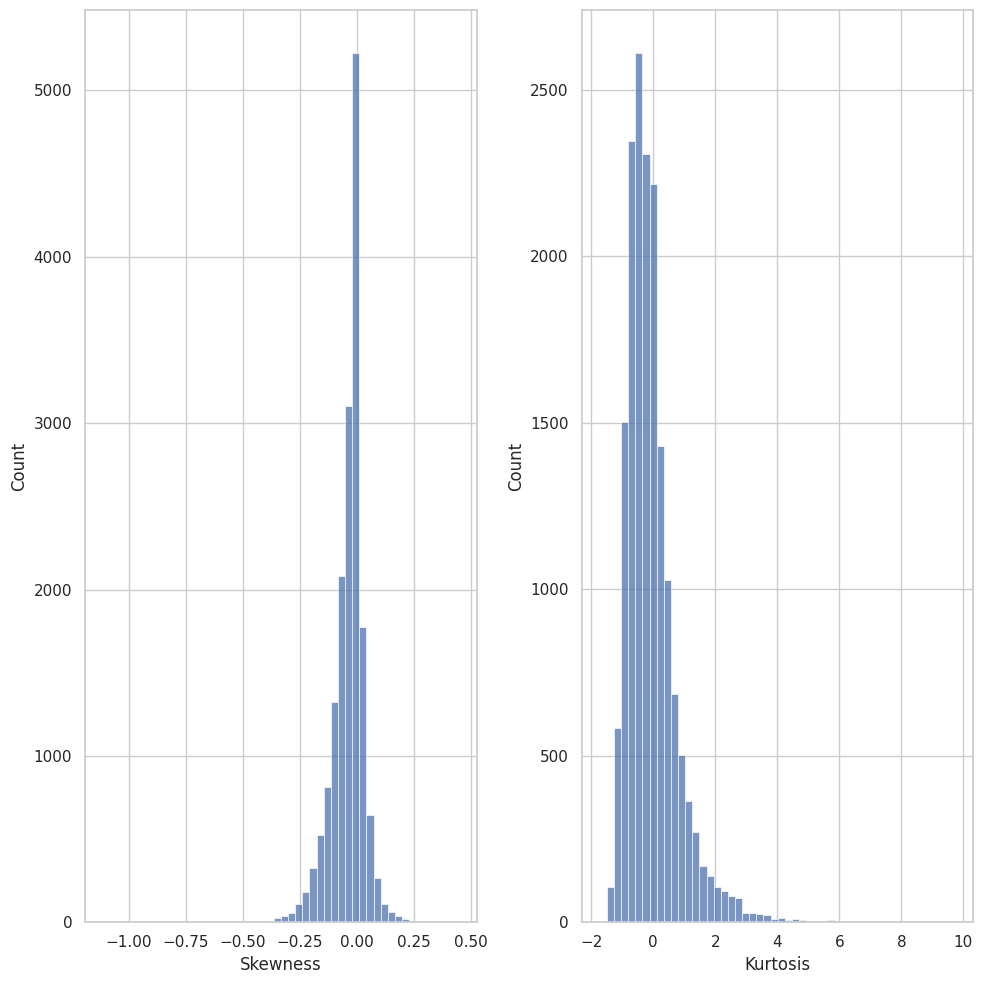

In [20]:
#skewness for each feature
okk = {
    "Skewness" : pd.Series(feature_data[feature_data.columns].skew()),
    "Kurtosis" : pd.Series(feature_data[feature_data.columns].kurtosis())
}
stats = pd.DataFrame(okk)
fig,ax = plt.subplots(figsize = (10,10),ncols = 2)
sns.histplot(stats['Skewness'],bins = 50, ax =ax[0])
sns.histplot(stats['Kurtosis'],bins = 50, ax =ax[1])
plt.tight_layout()
plt.show()

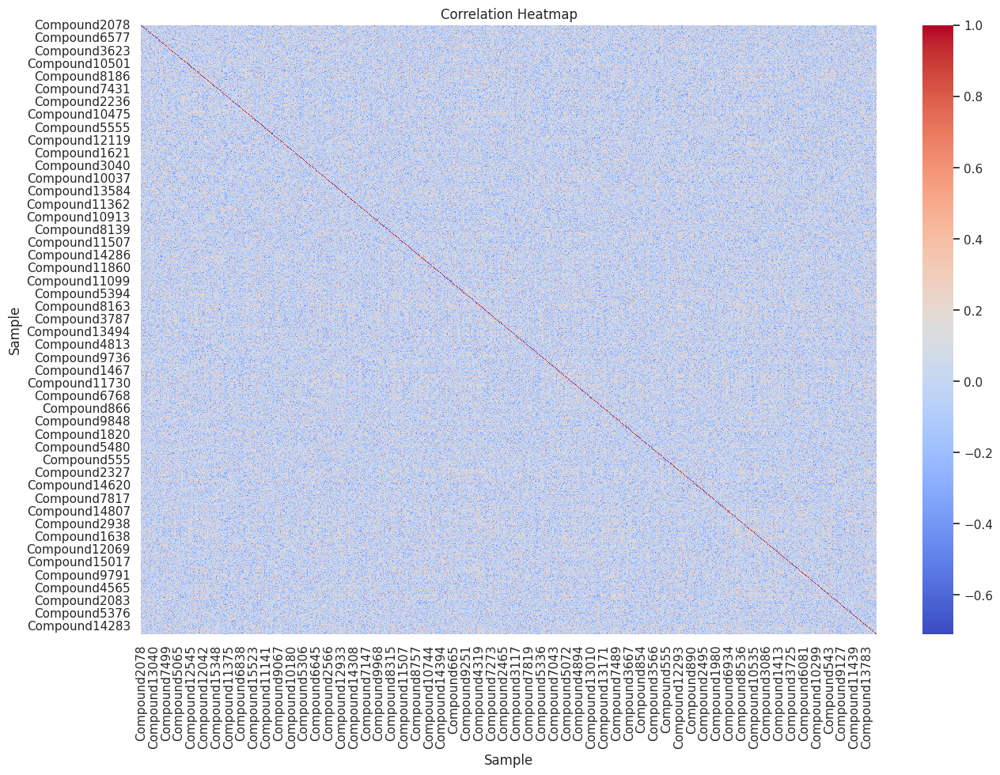

In [ ]:
plt.figure(figsize=(15, 10))
sns.heatmap(feature_data.iloc[:,:1000].corr(), cmap='coolwarm', annot=False, fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
#PCA Analysis for reduction and selection of relevant ones

n_components = 28
pca_list = []
feature_weight_list = []
for i in range(1,n_components):
  PCAmod = PCA(n_components = i)
  PCAmod.fit(feature_data.iloc[:,:-1])
  pca_list.append(pd.Series({
      "n" : i,
      "model" : PCAmod,
      "var" : PCAmod.explained_variance_ratio_.sum(),
  }))
  weights = PCAmod.explained_variance_ratio_.reshape(-1, 1) / PCAmod.explained_variance_ratio_.sum()
  overall_contributions = np.abs(PCAmod.components_) * weights
  abs_feature_values = overall_contributions.sum(axis=0)
  feature_weight_list.append(pd.DataFrame({
      'n': i,
      'features': feature_data.iloc[:,:-1].columns,
      'values': abs_feature_values / abs_feature_values.sum(),
  }))
pca_report = pd.DataFrame(pca_list)
feature_importance_report = pd.concat(feature_weight_list).pivot(index='n', columns='features', values='values')



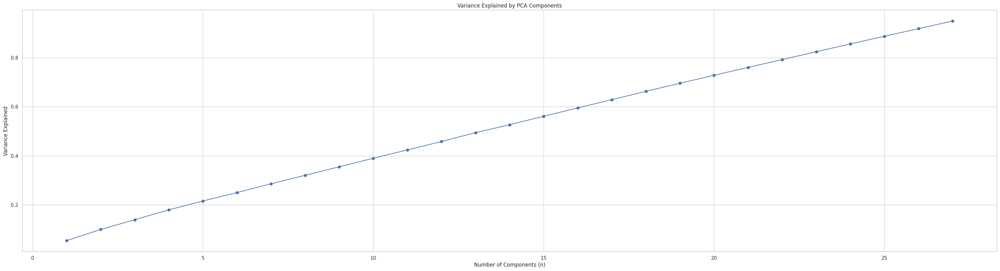

In [ ]:
fig,ax = plt.subplots(figsize = (40,10))
plt.plot(pca_report['n'], pca_report['var'], marker = 'o', linestyle = "-", color = 'b')
plt.title('Variance Explained by PCA Components')
# plt.axvline(x=150, color='r', linestyle='--', linewidth=2, label='Threshold at x=50')
plt.xlabel('Number of Components (n)')
plt.ylabel('Variance Explained')
plt.grid(True)
plt.show()


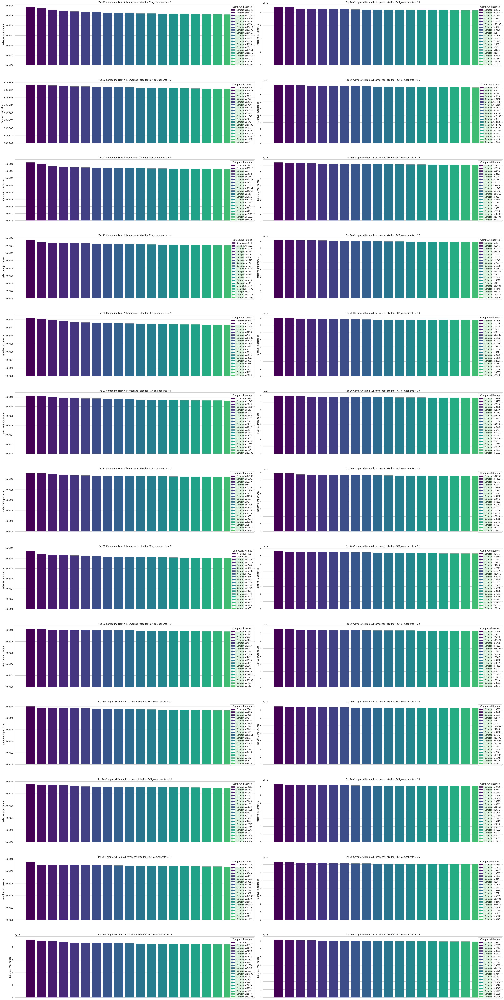

In [ ]:
n_top_compounds = 20  # Number of top compounds to display

# Get the top genes for the 20th component
top_component = {}
for k in range(26):
  top_component[f"component_{k}"] = feature_importance_report.iloc[k].nlargest(n_top_compounds)

# Plot the top genes for the 150th component
fig, ax = plt.subplots(figsize=(40, 80),nrows = 13, ncols = 2)

# Plot each bar with a unique color
for j in range(26):
  if j<13:
    for idx, (compound, importance) in enumerate(top_component[f"component_{j}"].items()):
      ax[j][0].bar(idx, importance, label=compound, color=plt.cm.viridis(idx / len(top_component)))
      ax[j][0].set_xticks([])
      ax[j][0].legend(loc='upper right', title='Compound Names')
      ax[j][0].set(ylabel='Relative Importance', title=f'Top 20 Compound From All componds listed for PCA_components = {j+1}')
  else:
    for idx, (compound, importance) in enumerate(top_component[f"component_{j}"].items()):
      ax[j-13][1].bar(idx, importance, label=compound, color=plt.cm.viridis(idx / len(top_component)))
      ax[j-13][1].set_xticks([])
      ax[j-13][1].legend(loc='upper right', title='Compound Names')
      ax[j-13][1].set(ylabel='Relative Importance', title=f'Top 20 Compound From All componds listed for PCA_components = {j+1}')

plt.tight_layout()
plt.show()

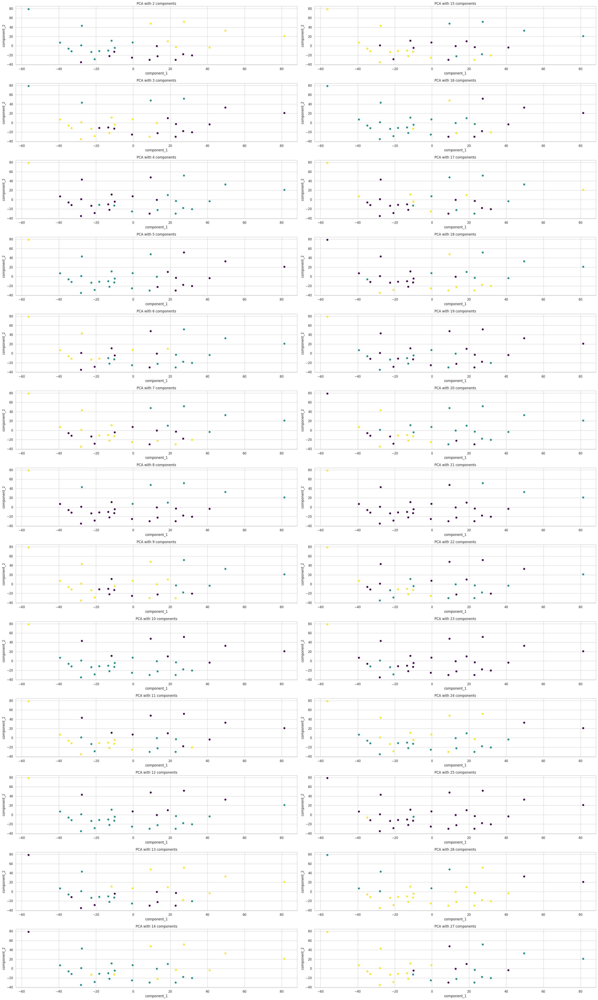

In [22]:
fig,ax = plt.subplots(figsize = (30,50),nrows = 13, ncols = 2)
for i in range(0,26):
    pca_model = PCA(n_components = i+2)
    pca_result = pca_model.fit_transform(feature_data.drop(columns = ['Label']))
    kmeans = KMeans(n_clusters=3,n_init=10)
    kmeans.fit(pca_result)
    cluster_labels = kmeans.labels_
    okk = pd.DataFrame(tsne_result)
    x_coordinates = [point[0] for point in okk.values]
    y_coordinates = [point[1] for point in okk.values]
    if i<13:
      ax[i][0].scatter(x_coordinates, y_coordinates, c=cluster_labels, cmap='viridis', marker='o')
      ax[i][0].set_title(f'PCA with {i+2} components')
      ax[i][0].set_xlabel(f"component_1")
      ax[i][0].set_ylabel(f"component_2")

    else:
      ax[i-13][1].scatter(x_coordinates, y_coordinates, c=cluster_labels, cmap='viridis', marker='o')
      ax[i-13][1].set_title(f'PCA with {i+2} components')
      ax[i-13][1].set_xlabel(f"component_1")
      ax[i-13][1].set_ylabel(f"component_2")

plt.tight_layout()
plt.show()

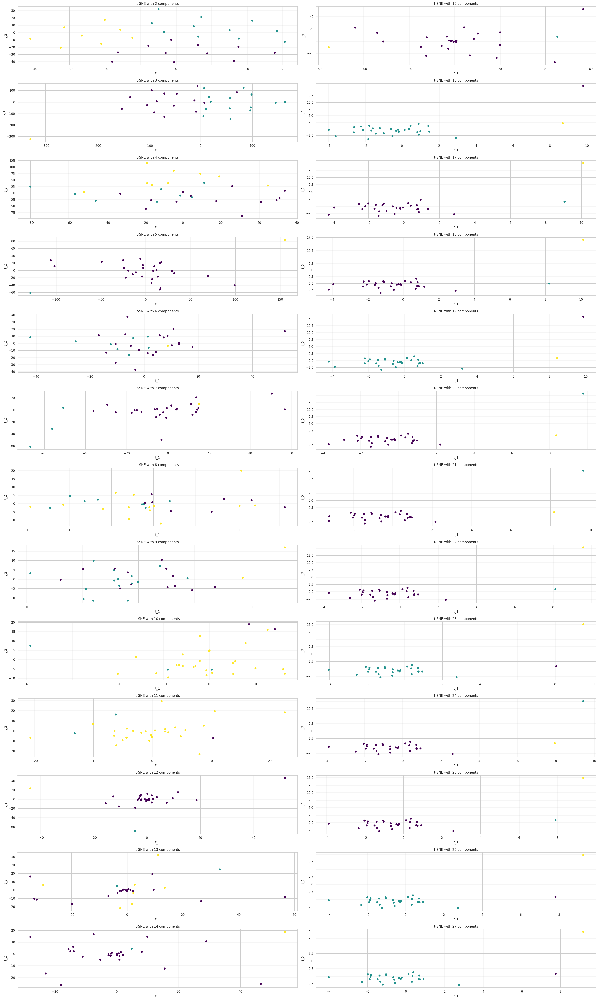

In [ ]:
fig,ax = plt.subplots(figsize = (30,50),nrows = 13, ncols = 2)
for i in range(0,26):
    tsne_model = TSNE(n_components = i+2, perplexity = 25,method='exact')
    tsne_result = tsne_model.fit_transform(feature_data.drop(columns = ['Label']))
    kmeans = KMeans(n_clusters=3,n_init=10)
    kmeans.fit(tsne_result)
    cluster_labels = kmeans.labels_
    okk = pd.DataFrame(tsne_result)
    x_coordinates = [point[0] for point in okk.values]
    y_coordinates = [point[1] for point in okk.values]
    if i<13:
      ax[i][0].scatter(x_coordinates, y_coordinates, c=cluster_labels, cmap='viridis', marker='o')
      ax[i][0].set_title(f't-SNE with {i+2} components')
      ax[i][0].set_xlabel(f"t_1")
      ax[i][0].set_ylabel(f"t_2")

    else:
      ax[i-13][1].scatter(x_coordinates, y_coordinates, c=cluster_labels, cmap='viridis', marker='o')
      ax[i-13][1].set_title(f't-SNE with {i+2} components')
      ax[i-13][1].set_xlabel(f"t_1")
      ax[i-13][1].set_ylabel(f"t_2")

plt.tight_layout()
plt.show()

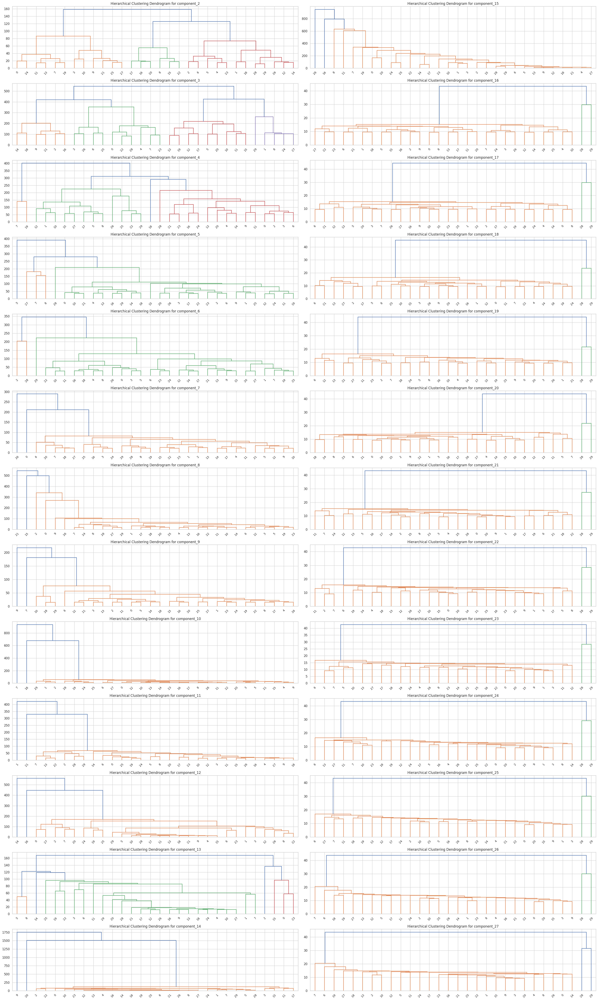

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram
fig,ax = plt.subplots(figsize = (30,50),nrows = 13, ncols = 2)

for i in range(0,26):
    tsne_model = TSNE(n_components = i+2, perplexity = 25,method='exact')
    tsne_result = tsne_model.fit_transform(feature_data.drop(columns = ['Label']))
    # Perform hierarchical clustering
    linkage_matrix = linkage(tsne_result, method='ward')

    if i<13:
      ax[i][0].set_title(f'Hierarchical Clustering Dendrogram for component_{i+2}')
      dendrogram(linkage_matrix, ax=ax[i][0])
    else:
      ax[i -13][1].set_title(f'Hierarchical Clustering Dendrogram for component_{i+2}')
      dendrogram(linkage_matrix, ax=ax[i-13][1])

plt.tight_layout()
plt.show()

In [23]:
feature_data['Label'] = feature_data['Label'].apply(lambda x: 1 if x == 1 else 0)
feature_data

Sample,Compound2078,Compound4363,Compound13589,Compound5278,Compound1640,Compound1644,Compound14195,Compound1725,Compound10230,Compound11327,...,Compound 5864,Compound 5869,Compound 5891,Compound 5900,Compound 5919,Compound 5930,Compound 5964,Compound 5978,Compound 5980,Label
S1,0.054180,-0.100584,-0.072038,0.031804,-1.359991,0.734368,-0.553593,-0.505212,1.459589,-0.629294,...,1.198207,1.178092,-1.528730,-0.594721,-0.708391,-1.151307,0.539402,1.330264,-0.725607,1
S2,0.185447,-0.063551,0.326378,-1.445199,1.080558,-0.857874,-1.100562,-0.370098,1.116944,0.318566,...,-0.633603,0.297903,-0.113692,-0.299673,-1.373940,-1.104287,-1.551825,-1.016591,1.141513,1
S3,0.964752,1.528995,-1.480277,0.121679,0.081117,-0.304521,-0.192816,0.813981,-0.001899,1.570607,...,-0.268681,1.161314,0.934590,-0.875828,-1.721014,-0.693081,-0.605668,0.873848,-0.031110,1
S4,0.388220,0.776949,-0.776755,-0.460003,0.884676,0.636588,0.448993,-0.493366,-0.067507,-0.326771,...,-0.510781,0.353246,0.334744,0.718840,1.529269,0.209630,-2.320200,-0.724508,-1.231284,1
S5,0.520463,0.829147,1.021200,-2.231341,1.142657,0.102119,-0.688137,0.395857,0.695941,-0.558950,...,0.521862,-1.279529,0.525862,-1.417511,1.737433,1.458325,1.825129,-0.632145,1.157030,1
S6,-1.358487,-1.006378,1.700056,0.922685,-1.184236,-0.126612,0.011772,-0.681381,-1.061151,1.267452,...,0.501035,0.792182,0.054024,-0.443589,-0.523742,0.519884,0.804961,0.926627,-0.957016,1
S7,-0.411969,1.503999,-0.363085,0.597063,0.329463,-0.323922,0.757405,-0.635181,0.729151,0.334731,...,0.025234,-1.450762,0.309545,0.586933,-0.468183,-1.705423,0.211390,-0.837863,1.319016,1
S8,-0.235863,-1.184963,1.184743,0.156637,-1.250253,0.045758,1.061314,1.370491,-0.415758,0.050721,...,0.619530,-1.085680,0.494829,-0.119813,1.178874,-0.987260,1.231034,-0.794680,1.367735,1
S9,1.089264,0.009396,-1.204284,0.098720,-0.345795,-0.523221,0.394303,-0.385557,-0.291661,-1.242068,...,0.206059,0.498880,-0.581774,-0.344437,-0.552353,-0.585168,1.628998,0.653137,-0.460422,0
S10,-0.271599,-0.420876,-1.288302,1.005000,0.503149,1.678651,0.229339,2.467083,-0.547809,0.553931,...,0.463530,1.147100,0.657473,1.982945,0.685938,-0.683938,0.008594,-1.323067,-0.628184,0


Sample
Compound2078     0.000000
Compound9771     0.000000
Compound9785     0.000000
Compound9825     0.000000
Compound9851     0.000000
                   ...   
Compound 871     0.098062
Compound 181     0.108587
Compound 2667    0.130899
Compound 195     0.171225
Compound1247     0.459728
Length: 16796, dtype: float32


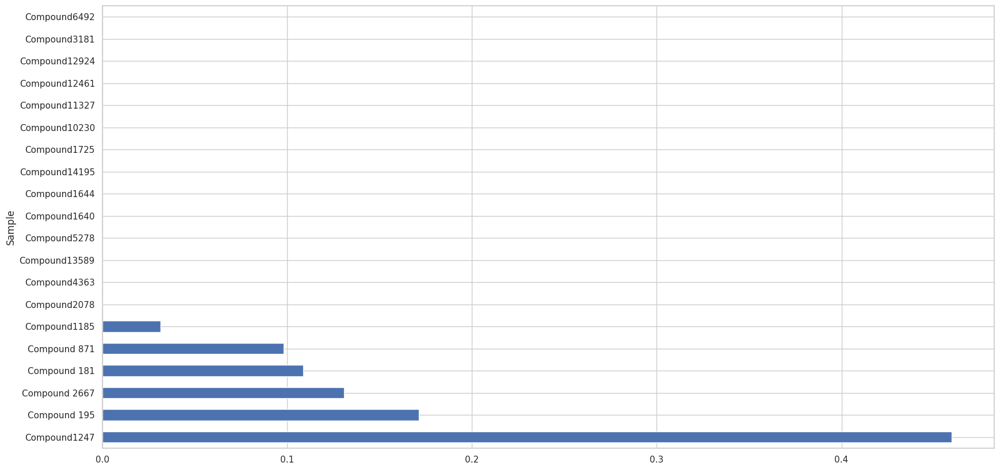

In [ ]:

#lets see each feature importance using XGB Classifier
import xgboost

x_sample = feature_data.drop(columns = ['Label'])
y_sample = feature_data['Label']

model = xgboost.XGBClassifier()
model.fit(x_sample,y_sample)

feat_imp = pd.Series(model.feature_importances_, index=x_sample.columns)
print(feat_imp.sort_values())
feat_imp.nlargest(20).plot(kind='barh',figsize=(20,10))

plt.show()

In [ ]:
#model building
from imblearn.over_sampling import SMOTE

X_train,X_test,y_train,y_test = train_test_split(x_sample,y_sample, test_size = 0.2, random_state = 123)
oversample = SMOTE()
X_train,y_train = oversample.fit_resample(X_train,y_train)
sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

#using xgboost boosting algorithms
model_1 = xgboost.XGBClassifier()
model_1.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

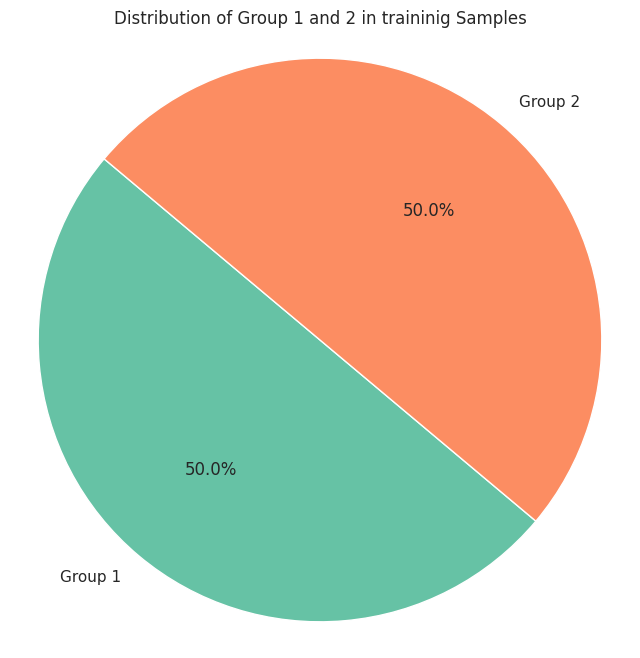

In [ ]:
group_counts = y_train.value_counts()
group1_count = group_counts[1]
group2_count = group_counts[0]

# Plotting
plt.figure(figsize=(8, 8))
plt.pie([group1_count, group2_count], labels=['Group 1', 'Group 2'], autopct='%1.1f%%', startangle=140, colors=['#66c2a5', '#fc8d62'])
plt.title('Distribution of Group 1 and 2 in traininig Samples')
plt.axis('equal')
plt.show()

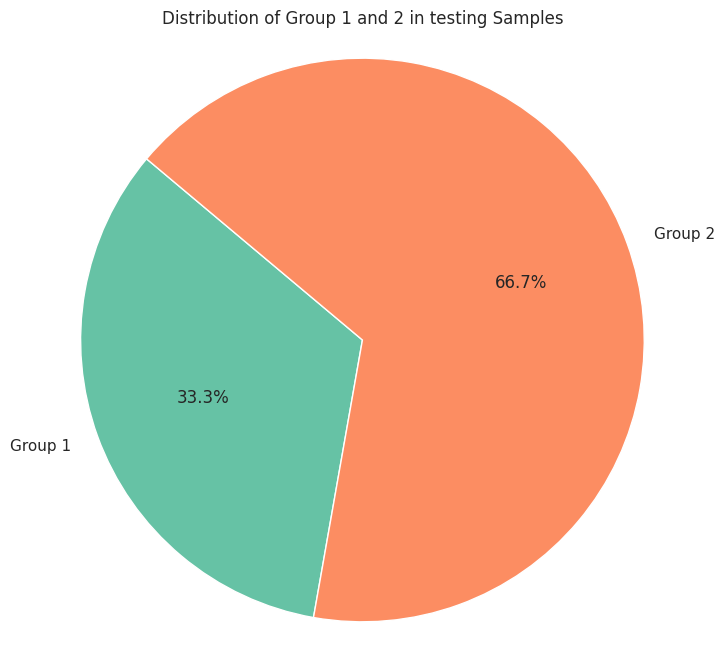

In [ ]:
group_counts = y_test.value_counts()
group1_count = group_counts[1]
group2_count = group_counts[0]

# Plotting
plt.figure(figsize=(8, 8))
plt.pie([group1_count, group2_count], labels=['Group 1', 'Group 2'], autopct='%1.1f%%', startangle=140, colors=['#66c2a5', '#fc8d62'])
plt.title('Distribution of Group 1 and 2 in testing Samples')
plt.axis('equal')
plt.show()

In [ ]:
def test_results(y_pred, y_test):
  results = {}
  results['Accuracy'] = accuracy_score(y_test,y_pred)
  results['Precision'] = precision_score(y_test,y_pred,average = 'weighted')
  results['Recall'] = recall_score(y_test,y_pred,average = 'weighted')
  results['F1_Score'] = f1_score(y_test,y_pred,average = 'weighted')

  cm = confusion_matrix(y_test,y_pred)
  return results,cm

In [ ]:
y_pred = model_1.predict(X_test)
metrics_1,cm_1 = test_results(y_pred, y_test)

In [ ]:
metrics_1

{'Accuracy': 0.8333333333333334,
 'Precision': 0.8666666666666667,
 'Recall': 0.8333333333333334,
 'F1_Score': 0.8148148148148149}

In [ ]:
#lets perform feature_selection

x_sample_1 = x_sample[['Compound1185','Compound 871','Compound 187','Compound 2667','Compound 195','Compound1247']]
x_sample_1

Sample,Compound1185,Compound 871,Compound 187,Compound 2667,Compound 195,Compound1247
S1,2.155333,1.480240,-0.107350,2.310022,1.237056,1.737991
S2,0.964687,1.312477,-0.060378,1.832641,1.414390,1.529370
S3,0.673291,1.027354,0.780583,0.531749,1.978834,0.924144
S4,1.422077,1.363425,-0.173374,0.471360,0.800210,1.960900
S5,1.537623,1.278584,0.228083,0.753198,1.045186,1.255241
S6,0.835378,1.076976,-1.147224,1.067208,1.036463,1.062608
S7,1.362918,1.120727,-1.559285,1.039580,1.189562,0.860405
S8,1.038160,1.151021,-0.342493,1.914748,1.912832,0.761930
S9,-0.412607,-0.498809,0.872613,-0.508395,-0.242769,0.822406
S10,-0.179996,0.165039,1.242096,-0.507865,0.103634,-1.548594


In [ ]:

X_train_1,X_test_1,y_train_1,y_test_1 = train_test_split(x_sample_1,y_sample, test_size = 0.2, random_state = 123)
oversample = SMOTE()
X_train_1,y_train_1 = oversample.fit_resample(X_train_1,y_train_1)
sc = StandardScaler()

X_train_1 = sc.fit_transform(X_train_1)
X_test_1 = sc.transform(X_test_1)

#using xgboost boosting algorithms
model_11 = xgboost.XGBClassifier()
model_11.fit(X_train_1,y_train_1)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
y_pred_1 = model_11.predict(X_test_1)
metrics_11,cm_11 = test_results(y_pred, y_test)
metrics_11

{'Accuracy': 0.8333333333333334,
 'Precision': 0.8666666666666667,
 'Recall': 0.8333333333333334,
 'F1_Score': 0.8148148148148149}

In [ ]:
#using logistic regression algorithm
model_2 = LogisticRegression()
model_2.fit(X_train,y_train)

LogisticRegression()

In [ ]:
y_pred_2 = model_2.predict(X_test)
metrics_2, cm_2 = test_results(y_pred_2, y_test)
metrics_2

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'Accuracy': 0.6666666666666666,
 'Precision': 0.4444444444444444,
 'Recall': 0.6666666666666666,
 'F1_Score': 0.5333333333333333}

In [ ]:
#using SVM algorithm using various kernels
model_3 = svm.SVC(kernel = 'linear',probability = True)
model_4 = svm.SVC(kernel = 'poly',probability = True)
model_5 = svm.SVC(kernel = 'rbf',probability = True)

model_3.fit(X_train,y_train)
model_4.fit(X_train,y_train)
model_5.fit(X_train,y_train)

SVC(probability=True)

In [ ]:
y_pred_3 = model_3.predict(X_test)
metrics_3, cm_3 = test_results(y_pred_3, y_test)

y_pred_4 = model_4.predict(X_test)
metrics_4, cm_4 = test_results(y_pred_4, y_test)

y_pred_5 = model_3.predict(X_test)
metrics_5, cm_5 = test_results(y_pred_5, y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
metrics_3

{'Accuracy': 0.6666666666666666,
 'Precision': 0.4444444444444444,
 'Recall': 0.6666666666666666,
 'F1_Score': 0.5333333333333333}

In [ ]:
metrics_4

{'Accuracy': 0.3333333333333333,
 'Precision': 0.1111111111111111,
 'Recall': 0.3333333333333333,
 'F1_Score': 0.16666666666666666}

In [ ]:
metrics_5

{'Accuracy': 0.6666666666666666,
 'Precision': 0.4444444444444444,
 'Recall': 0.6666666666666666,
 'F1_Score': 0.5333333333333333}

In [ ]:
#using RandomForest with estimator = 1500 which is no of trees employed
model_6 = RandomForestClassifier(n_estimators = 1500, criterion = 'entropy', random_state = 42)
model_6.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', n_estimators=1500, random_state=42)

In [ ]:
y_pred_6 = model_6.predict(X_test)
metrics_6,cm_6 = test_results(y_pred_6,y_test)
metrics_6

{'Accuracy': 0.8333333333333334,
 'Precision': 0.8666666666666667,
 'Recall': 0.8333333333333334,
 'F1_Score': 0.8148148148148149}

In [ ]:
#using ANN for classification
model_7 = tf.keras.Sequential([
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.6),
    layers.BatchNormalization(),
    layers.Dense(1, activation='sigmoid')
])

# Compile model
model_7.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
history = model_7.fit(X_train, y_train, validation_data = (X_test,y_test), epochs = 50)

Epoch 1/50
2/2 [==============================] - 3s 432ms/step - loss: 1.0553 - accuracy: 0.5000 - val_loss: 0.8007 - val_accuracy: 0.3333
Epoch 2/50
2/2 [==============================] - 0s 90ms/step - loss: 0.6584 - accuracy: 0.6667 - val_loss: 0.6582 - val_accuracy: 0.6667
Epoch 3/50
2/2 [==============================] - 0s 85ms/step - loss: 0.4399 - accuracy: 0.8611 - val_loss: 0.5817 - val_accuracy: 0.8333
Epoch 4/50
2/2 [==============================] - 0s 125ms/step - loss: 0.6197 - accuracy: 0.6944 - val_loss: 0.5323 - val_accuracy: 0.6667
Epoch 5/50
2/2 [==============================] - 0s 80ms/step - loss: 0.4113 - accuracy: 0.8056 - val_loss: 0.5140 - val_accuracy: 0.6667
Epoch 6/50
2/2 [==============================] - 0s 85ms/step - loss: 0.6398 - accuracy: 0.6389 - val_loss: 0.5134 - val_accuracy: 0.6667
Epoch 7/50
2/2 [==============================] - 0s 126ms/step - loss: 0.3132 - accuracy: 0.9167 - val_loss: 0.5143 - val_accuracy: 0.6667
Epoch 8/50
2/2 [========

In [ ]:
y_pred_7 = model_7.predict(X_test)
y_pred_7 = (y_pred_7 >= 0.5).astype(int)
metrics_7,cm_7 = test_results(y_pred_7,y_test)

1/1 [==============================] - 0s 213ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
metrics_7

{'Accuracy': 0.6666666666666666,
 'Precision': 0.4444444444444444,
 'Recall': 0.6666666666666666,
 'F1_Score': 0.5333333333333333}

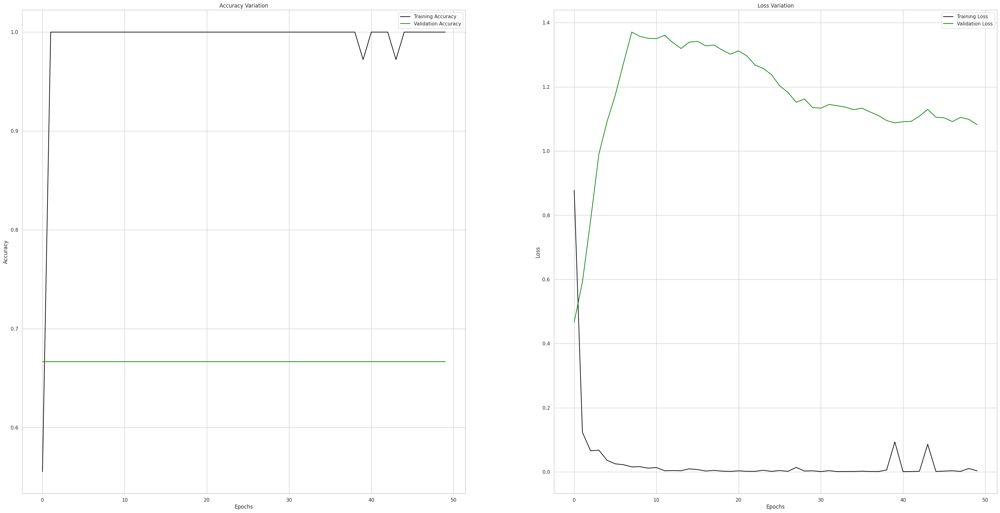

In [ ]:
fig,ax = plt.subplots(figsize = (40,20), ncols = 2)
ax[0].plot(history.history['accuracy'],color = 'black', label = 'Training Accuracy')
ax[0].plot(history.history['val_accuracy'],color = 'green', label = 'Validation Accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_title('Accuracy Variation')
ax[0].legend()

ax[1].plot(history.history['loss'],color = 'black', label = 'Training Loss')
ax[1].plot(history.history['val_loss'],color = 'green', label = 'Validation Loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_title('Loss Variation')
ax[1].legend()
plt.show()

In [ ]:
model_list = {
    "XGBoost" : pd.Series(metrics_1),
    "Logistic_Regression" : pd.Series(metrics_2),
    "SVM_Linear" : pd.Series(metrics_3),
    "SVM_Polynomial" : pd.Series(metrics_4),
    "SVM_RBF" : pd.Series(metrics_5),
    "Random_Forest" : pd.Series(metrics_6),
    "ANN" : pd.Series(metrics_7)
}

pd.DataFrame(model_list).T


,Accuracy,Precision,Recall,F1_Score
XGBoost,0.833333,0.866667,0.833333,0.814815
Logistic_Regression,0.666667,0.444444,0.666667,0.533333
SVM_Linear,0.666667,0.444444,0.666667,0.533333
SVM_Polynomial,0.333333,0.111111,0.333333,0.166667
SVM_RBF,0.666667,0.444444,0.666667,0.533333
Random_Forest,0.833333,0.866667,0.833333,0.814815
ANN,0.666667,0.444444,0.666667,0.533333


<ipython-input-97-da2bf7d3d37b>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = okk[1][:80], y = okk[0][:80], data = okk, palette='viridis')


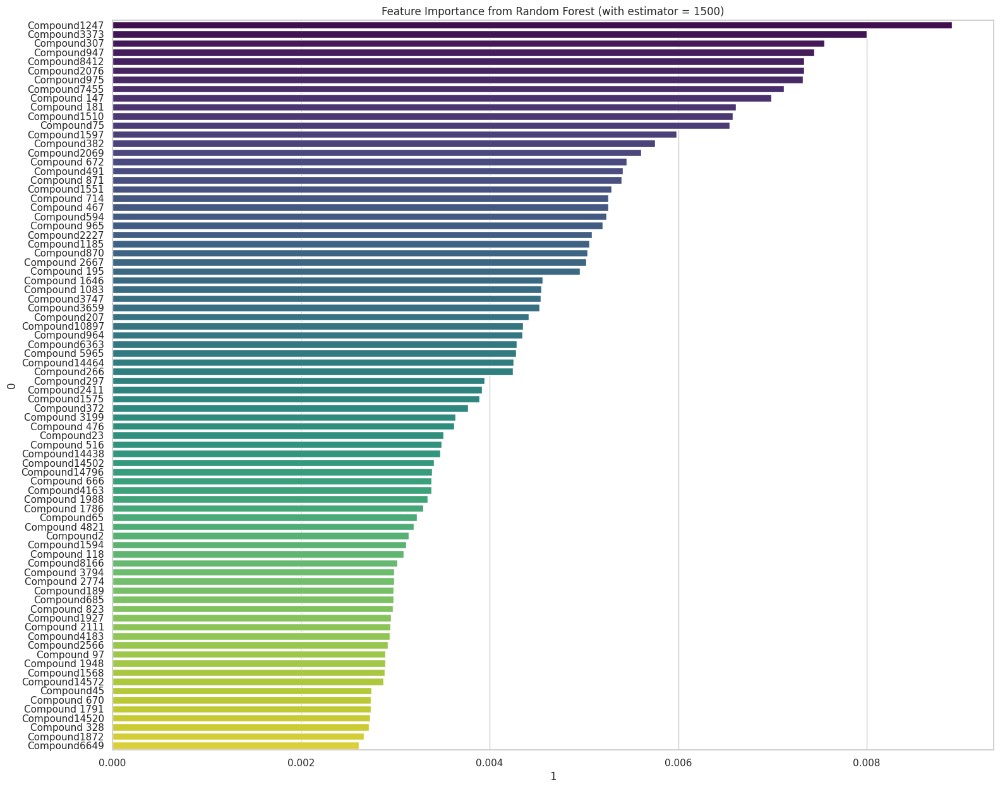

In [ ]:
feature_importance = model_6.feature_importances_
okk = pd.DataFrame([x_sample.columns, feature_importance]).T
okk = okk.sort_values(by = 1,ascending = False)
plt.figure(figsize=(18, 15))
sns.barplot(x = okk[1][:80], y = okk[0][:80], data = okk, palette='viridis')
plt.title("Feature Importance from Random Forest (with estimator = 1500)")
plt.show()

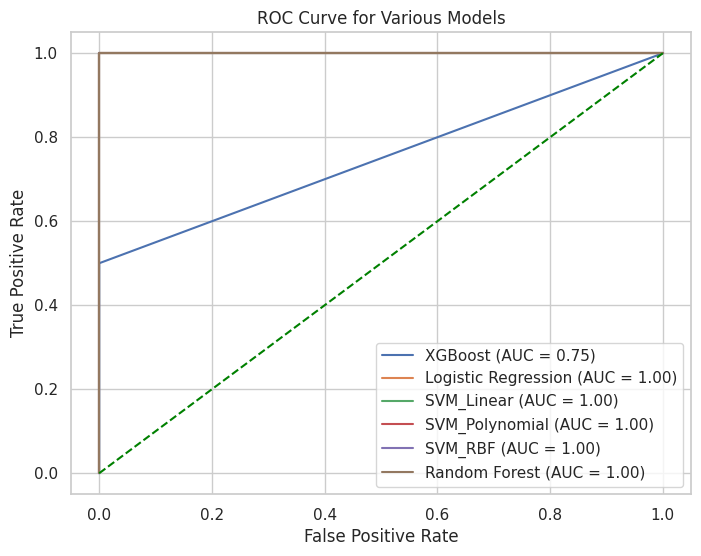

In [ ]:
#roc-auc curve for various algorithm
fpr_1, tpr_1, _ = roc_curve(y_test, model_1.predict_proba(X_test)[:, 1])
fpr_2, tpr_2, _ = roc_curve(y_test, model_2.predict_proba(X_test)[:, 1])
fpr_3, tpr_3, _ = roc_curve(y_test, model_3.predict_proba(X_test)[:, 1])
fpr_4, tpr_4, _ = roc_curve(y_test, model_4.predict_proba(X_test)[:, 1])
fpr_5, tpr_5, _ = roc_curve(y_test, model_5.predict_proba(X_test)[:, 1])
fpr_6, tpr_6, _ = roc_curve(y_test, model_6.predict_proba(X_test)[:, 1])

from sklearn.metrics import roc_auc_score

auc_1 = roc_auc_score(y_test, model_1.predict_proba(X_test)[:, 1])
auc_2 = roc_auc_score(y_test, model_2.predict_proba(X_test)[:, 1])
auc_3 = roc_auc_score(y_test, model_3.predict_proba(X_test)[:, 1])
auc_4 = roc_auc_score(y_test, model_4.predict_proba(X_test)[:, 1])
auc_5 = roc_auc_score(y_test, model_5.predict_proba(X_test)[:, 1])
auc_6 = roc_auc_score(y_test, model_6.predict_proba(X_test)[:, 1])

# Plot ROC curves for each model with AUC values in the legend
plt.figure(figsize=(8, 6))
plt.plot(fpr_1, tpr_1, label=f'XGBoost (AUC = {auc_1:.2f})')
plt.plot(fpr_2, tpr_2, label=f'Logistic Regression (AUC = {auc_2:.2f})')
plt.plot(fpr_3, tpr_3, label=f'SVM_Linear (AUC = {auc_3:.2f})')
plt.plot(fpr_4, tpr_4, label=f'SVM_Polynomial (AUC = {auc_4:.2f})')
plt.plot(fpr_5, tpr_5, label=f'SVM_RBF (AUC = {auc_5:.2f})')
plt.plot(fpr_6, tpr_6, label=f'Random Forest (AUC = {auc_6:.2f})')

# Plot the diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='green', linestyle='--')

# Set labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Various Models')
plt.legend()
plt.show()

In [ ]:
tsne_model = TSNE(n_components = 17, perplexity = 25,method='exact')
tsne_result = tsne_model.fit_transform(feature_data.drop(columns = ['Label']))
tsne_columns = [f'tsne_{i}' for i in range(tsne_result.shape[1])]
okk_data = pd.concat([pd.DataFrame(tsne_result, columns=tsne_columns, index = feature_data.index),
                           feature_data['Label']], axis=1)
okk_data

,tsne_0,tsne_1,tsne_2,tsne_3,tsne_4,tsne_5,tsne_6,tsne_7,tsne_8,tsne_9,tsne_10,tsne_11,tsne_12,tsne_13,tsne_14,tsne_15,tsne_16,Label
S1,-1.398624,-3.499002,1.367936,-1.321473,0.407191,-3.430084,-0.441319,0.999884,-1.078918,3.134171,-1.619175,-0.000472,-3.162408,-2.830880,0.972434,-0.583669,2.407467,1
S2,-0.476218,-2.457453,3.446388,-0.223458,0.126153,-3.069783,2.155326,1.680565,-2.053447,-4.114920,-0.594317,-0.332085,-1.095763,0.362895,1.824479,-0.564696,-0.395856,1
S3,-3.102120,-2.450856,0.010919,-2.575699,0.562909,1.247916,-0.010383,-2.372484,1.107166,1.155526,-1.893217,-3.011782,0.079845,1.192691,1.975776,-2.252921,-3.795071,1
S4,0.668310,-2.054663,1.064113,-3.728180,1.749158,1.370052,-0.989786,2.215405,1.812206,-1.176081,2.546422,-1.320971,0.318082,-1.564566,0.355556,0.966333,-1.389208,1
S5,-2.257971,-1.040156,1.641935,0.088506,-1.263977,1.925759,-4.850851,0.000951,-3.146434,1.250011,2.287266,-0.194727,-0.296614,-1.584870,-0.812970,2.168386,1.655216,1
S6,-1.433404,-1.804298,1.412818,-1.974413,1.281600,3.341279,-0.697613,-1.885152,-0.134736,-0.727028,0.952533,4.144041,0.561804,2.118574,-3.908823,-2.275399,0.533971,1
S7,-3.465299,-0.147432,-0.671519,1.584067,1.564325,0.070088,5.013328,-3.193707,1.658558,-1.400868,-0.517875,0.896757,3.483990,-3.021388,-3.003319,3.352663,-1.152614,1
S8,-0.806864,-2.015493,3.717812,-0.812874,2.296934,4.080884,-1.977964,1.592044,2.537004,-0.536985,-3.994440,0.247560,4.274515,0.726726,4.468472,-1.935276,0.540930,1
S9,0.889022,-1.036973,1.822386,-0.850463,1.490529,-1.423539,-0.391995,2.456413,-1.996094,1.026108,-2.775640,2.447947,-0.192633,-0.464801,-6.354938,0.128056,0.127280,0
S10,-0.287460,-0.821690,1.303612,1.580453,2.395077,-2.905721,-3.313462,-3.314497,1.472723,-0.676715,-0.212518,0.800727,-0.590174,0.357356,0.671641,0.446623,-0.820049,0


In [ ]:
x_ = okk_data.drop(columns = ['Label'])
y_ = okk_data['Label']

In [ ]:
#model building
from imblearn.over_sampling import SMOTE
import xgboost
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, make_scorer

scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score, average='binary'),
    'recall': make_scorer(recall_score, average='binary'),
    'f1_score': make_scorer(f1_score, average='binary')
}


X_train,X_test,y_train,y_test = train_test_split(x_,y_, test_size = 0.2, random_state = 123)
oversample = SMOTE()
X_train,y_train = oversample.fit_resample(X_train,y_train)
sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

param_grid = {
    'learning_rate': [0.1, 0.01],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 0.9, 1.0],
    'reg_alpha': [1.0, 2.0, 5.0],  # High penalty values for L1 regularization
    'reg_lambda': [1.0, 2.0, 5.0]  # High penalty values for L2 regularization
}

model_1 = GridSearchCV(estimator=xgboost.XGBClassifier(reg_alpha=0.1, reg_lambda=0.1),
                           param_grid=param_grid,
                           cv=3,
                           scoring=scoring,
                           refit='f1_score',
                           verbose=2,
                           n_jobs=-1)

# Perform grid search on the training data
model_1.fit(X_train, y_train)

# #using xgboost boosting algorithms
# model_1 = xgboost.XGBClassifier(reg_alpha=0.1, reg_lambda=0.1)
# model_1.fit(X_train,y_train)

Fitting 3 folds for each of 486 candidates, totalling 1458 fits


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
             param_grid={'learning_rate': [0.1, 0.01], 'max_depth': [3, 5, 7],
                         'n_estimators': [100, 200, 300],
                         'reg_alpha': [1.0, 2.0, 5.0],
                         'reg_lambda': [1.0, 2.0, 5.0],
                         'subsample': [0.8, 0.9, 1.0]},
             refit='f1_score',
             scoring={'accuracy': make_scorer(accuracy_score),
                      'f1_score': make_scorer(f1_score, average=binary),
                      'precision': make_scorer(precision_score, average=binary),
                      'recall': make_scorer(recall_score, average=binary)},
             verbose=2)

In [ ]:
best_params = model_1.best_params_
print("Best Hyperparameters for XGBoost:", best_params)

# Get the best estimator
best_estimator = model_1.best_estimator_

# Predict on the test set
y_pred = best_estimator.predict(X_test)
metrics_1,cm_1 = test_results(y_pred, y_test)
metrics_1

Best Hyperparameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'reg_alpha': 1.0, 'reg_lambda': 1.0, 'subsample': 0.8}


{'Accuracy': 0.8333333333333334,
 'Precision': 0.8888888888888888,
 'Recall': 0.8333333333333334,
 'F1_Score': 0.8380952380952381}

In [ ]:
param_grid = {
    'C': [0.001, 0.01],  # Regularization parameter
    'penalty':['l2'],  # Regularization type
    'solver': ['liblinear', 'lbfgs']  # Solver type
}

logistic_model = LogisticRegression()
model_2 = GridSearchCV(estimator=logistic_model,
                           param_grid=param_grid,
                           scoring={'accuracy': 'accuracy',
                                    'precision': 'precision',
                                    'recall': 'recall',
                                    'f1_score': 'f1'},
                           cv=3,
                           refit='f1_score',  # Refit based on f1_score
                           verbose=2,
                           n_jobs=-1)
model_2.fit(X_train, y_train)

Fitting 3 folds for each of 4 candidates, totalling 12 fits


GridSearchCV(cv=3, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.001, 0.01], 'penalty': ['l2'],
                         'solver': ['liblinear', 'lbfgs']},
             refit='f1_score',
             scoring={'accuracy': 'accuracy', 'f1_score': 'f1',
                      'precision': 'precision', 'recall': 'recall'},
             verbose=2)

In [ ]:
best_params = model_2.best_params_
print("Best Hyperparameters for Logistic Regression:", best_params)

# Get the best estimator
best_estimator = model_2.best_estimator_

# Predict on the test set
y_pred = best_estimator.predict(X_test)
metrics_2,cm_2 = test_results(y_pred, y_test)
metrics_2

Best Hyperparameters for Logistic Regression: {'C': 0.001, 'penalty': 'l2', 'solver': 'liblinear'}


{'Accuracy': 0.8333333333333334,
 'Precision': 0.8888888888888888,
 'Recall': 0.8333333333333334,
 'F1_Score': 0.8380952380952381}

In [ ]:
param_grid_linear = {
    'C': [0.001, 0.01],  # Regularization parameter
}

param_grid_poly = {
    'C': [0.001, 0.01],  # Regularization parameter
    'degree': [2, 3, 4],  # Degree of the polynomial kernel
}

param_grid_rbf = {
    'C': [0.001, 0.01],  # Regularization parameter
    'gamma': ['scale', 'auto', 0.1, 1.0],  # Kernel coefficient for RBF
}

#using SVM algorithm using various kernels
linear = svm.SVC(kernel = 'linear',probability = True)
poly = svm.SVC(kernel = 'poly',probability = True)
rbf = svm.SVC(kernel = 'rbf',probability = True)

# Creating GridSearchCV objects for each model
model_3 = GridSearchCV(estimator=linear,
                                  param_grid=param_grid_linear,
                                  scoring={'accuracy': 'accuracy',
                                           'precision': 'precision',
                                           'recall': 'recall',
                                           'f1_score': 'f1'},
                                  cv=3,
                                  refit='f1_score',  # Refit based on F1-score
                                  verbose=2,
                                  n_jobs=-1)

model_4 = GridSearchCV(estimator=poly,
                                param_grid=param_grid_poly,
                                scoring={'accuracy': 'accuracy',
                                         'precision': 'precision',
                                         'recall': 'recall',
                                         'f1_score': 'f1'},
                                cv=3,
                                refit='f1_score',  # Refit based on F1-score
                                verbose=2,
                                n_jobs=-1)

model_5 = GridSearchCV(estimator=rbf,
                               param_grid=param_grid_rbf,
                               scoring={'accuracy': 'accuracy',
                                        'precision': 'precision',
                                        'recall': 'recall',
                                        'f1_score': 'f1'},
                               cv=3,
                               refit='f1_score',  # Refit based on F1-score
                               verbose=2,
                               n_jobs=-1)

model_3.fit(X_train,y_train)
model_4.fit(X_train,y_train)
model_5.fit(X_train,y_train)

Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 6 candidates, totalling 18 fits
Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3, estimator=SVC(probability=True), n_jobs=-1,
             param_grid={'C': [0.001, 0.01],
                         'gamma': ['scale', 'auto', 0.1, 1.0]},
             refit='f1_score',
             scoring={'accuracy': 'accuracy', 'f1_score': 'f1',
                      'precision': 'precision', 'recall': 'recall'},
             verbose=2)

In [ ]:
best_params = model_3.best_params_
print("Best Hyperparameters for SVM Linear Kernel", best_params)

# Get the best estimator
best_estimator = model_3.best_estimator_

# Predict on the test set
y_pred = best_estimator.predict(X_test)
metrics_3,cm_3 = test_results(y_pred, y_test)
metrics_3

Best Hyperparameters for SVM Linear Kernel {'C': 0.001}


{'Accuracy': 0.5,
 'Precision': 0.7999999999999999,
 'Recall': 0.5,
 'F1_Score': 0.45714285714285713}

In [ ]:
best_params = model_4.best_params_
print("Best Hyperparameters for SVM Polynomial Kernel", best_params)

# Get the best estimator
best_estimator = model_4.best_estimator_

# Predict on the test set
y_pred = best_estimator.predict(X_test)
metrics_4,cm_4 = test_results(y_pred, y_test)
metrics_4

Best Hyperparameters for SVM Polynomial Kernel {'C': 0.001, 'degree': 3}


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'Accuracy': 0.3333333333333333,
 'Precision': 0.1111111111111111,
 'Recall': 0.3333333333333333,
 'F1_Score': 0.16666666666666666}

In [ ]:
best_params = model_5.best_params_
print("Best Hyperparameters for SVM RBF Kernel", best_params)

# Get the best estimator
best_estimator = model_5.best_estimator_

# Predict on the test set
y_pred = best_estimator.predict(X_test)
metrics_5,cm_5 = test_results(y_pred, y_test)
metrics_5

Best Hyperparameters for SVM RBF Kernel {'C': 0.001, 'gamma': 0.1}


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'Accuracy': 0.6666666666666666,
 'Precision': 0.4444444444444444,
 'Recall': 0.6666666666666666,
 'F1_Score': 0.5333333333333333}

In [ ]:
#using RandomForest with estimator = 1500 which is no of trees employed
param_grid = {
    'max_depth': [None, 10, 20, 30],  # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required at each leaf node
    'bootstrap': [True, False]  # Whether bootstrap samples are used when building trees
}

random_forest = RandomForestClassifier(n_estimators = 1500, criterion = 'entropy', random_state = 42)

model_6 = GridSearchCV(estimator=random_forest,
                           param_grid=param_grid,
                           scoring={'accuracy': 'accuracy',
                                    'precision': 'precision',
                                    'recall': 'recall',
                                    'f1_score': 'f1'},
                           cv=3,
                           refit='f1_score',  # Refit based on F1-score
                           verbose=2,
                           n_jobs=-1)

model_6.fit(X_train,y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


GridSearchCV(cv=3,
             estimator=RandomForestClassifier(criterion='entropy',
                                              n_estimators=1500,
                                              random_state=42),
             n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             refit='f1_score',
             scoring={'accuracy': 'accuracy', 'f1_score': 'f1',
                      'precision': 'precision', 'recall': 'recall'},
             verbose=2)

In [ ]:
best_params = model_6.best_params_
print("Best Hyperparameters for Random Forest", best_params)

# Get the best estimator
best_estimator = model_6.best_estimator_

# Predict on the test set
y_pred = best_estimator.predict(X_test)
metrics_6,cm_6 = test_results(y_pred, y_test)
metrics_6

Best Hyperparameters for Random Forest {'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}


{'Accuracy': 0.8333333333333334,
 'Precision': 0.8888888888888888,
 'Recall': 0.8333333333333334,
 'F1_Score': 0.8380952380952381}